In [2]:
import sklearn
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import cross_validate, StratifiedKFold, KFold
import numpy as np
from sklearn.datasets import load_iris
import pandas as pd
import os
import re 
import sys 
import importlib
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import (
	OneHotEncoder,
	OrdinalEncoder,
	RobustScaler,
)
from sklearn.preprocessing import (
	PowerTransformer, 
	QuantileTransformer
)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer, StandardScaler, QuantileTransformer, Normalizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import cross_validate
sklearn.set_config(enable_metadata_routing=False)
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_selector as selector
from xgboost import XGBClassifier, XGBRegressor
import time 
import pandas as pd
import os
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer, StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import make_scorer
from sklearn.model_selection import GroupKFold, cross_validate
from sklearn.base import BaseEstimator, RegressorMixin
from scipy.stats import pearsonr
import plotly.express as px
from sklearn.linear_model import Ridge
from sklearn.decomposition import PCA
from sklearn.ensemble import HistGradientBoostingRegressor
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score, mean_absolute_error

import shap
shap.initjs()

# Get the absolute path of the project root
project_root = os.getcwd()
# Define data directory
brighten_dir = os.path.join(project_root, 'BRIGHTEN_data')
sub_dir = os.path.join(project_root, 'BRIGHTEN_data', 'sub_dfs')
results_dir = os.path.join(project_root, 'results')


# Add project root to sys.path for script usage
sys.path.append(project_root)

# Import and reload (optional) custom scripts
from scripts import preprocessing as pre
from scripts import visualization as vis
from scripts import variables 
from scripts import feature_selection as fs
importlib.reload(pre)
importlib.reload(vis)
importlib.reload(variables)
importlib.reload(fs)


################ DEFINE column variables from data ###################
from scripts.variables import id_columns
from scripts.variables import all_cols, all_daily_cols, weekly_cols, baseline_cols, drop_weekly_cols
from scripts.variables import daily_cols_v1, daily_v2_sensor_hr, daily_v2_weather, daily_cols_v2 
from scripts.variables import gad_cols, phq9_base, alc_cols, phq9_cols, phq2_cols, sleep_cols, gic_cols, sds_cols


# Define label variables
df_names = ['v1_day', 'v2_day', 'v1_week', 'v2_week']
aggregate_dfs = ['alldays_df','week_df']
# Update endings list if order changes


########################################## MODELS #######################################


# Models
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from xgboost import XGBRegressor
# Dummy baseline model
class GroupMeanRegressor(BaseEstimator, RegressorMixin):
	def fit(self, X, y, groups):
		self.group_means_ = y.groupby(groups.squeeze()).mean().squeeze()
		self.global_mean_ = y.mean().squeeze()
		return self
	
	def predict(self, X, groups):
		return groups.squeeze().map(self.group_means_).fillna(self.global_mean_).values

# Pearson scorer
def pearsonr_scorer(y_true, y_pred):
	return pearsonr(y_true, y_pred)[0]

models = {
	'Random Forest': RandomForestRegressor(random_state=42),
	'XGBoost': XGBRegressor(objective='reg:squarederror', random_state=42),
	'Hist Gradient Boost': HistGradientBoostingRegressor(),
	'Group Mean': GroupMeanRegressor(),
	'Ridge': Ridge(alpha=1.0)
}
from sklearn.metrics import make_scorer
from scipy.stats import pearsonr

def pearsonr_scorer(y_true, y_pred):
	return pearsonr(y_true, y_pred)[0]

scoring_metrics = {
	'r2': 'r2',
	'neg_mae': 'neg_mean_absolute_error',
	'neg_rmse': 'neg_root_mean_squared_error',
}



## Anova for feature analysis for all subjects

In [ ]:
## Anova for feature analysis
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold
import pandas as pd
from collections import Counter


anova_features = {}
top_features = {}
	

for y_col in ['phq2_sum','phq9_sum']:
	anova_features[y_col] = {}
	top_features[y_col]={}

	for name in ['v1_day','v2_day','v1_week','v2_week']:
		top_features[y_col][name] = {}
		print(f'################ {name} ###############')
		df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_nonskew.csv'))
		for sub, sub_df in df.groupby('num_id'):
			
			sub_df = sub_df.drop(columns=[col for col in sub_df.columns if 'Unnamed' in col or '_nan' in col or '_indicator' in col or col in ['day','week','month']])
			df_cov = sub_df.loc[:, sub_df.notna().mean() > 0.7]
			if y_col not in df_cov.columns:
				df_cov[y_col] = df[y_col].copy()
			#print(f'Not including these columns in X, not enough coverage: ', [col for col in df.columns if col not in df_cov.columns])
			df_full = df_cov.dropna()
			#print(f'Shape before dropna: {df_cov.shape}, shape afer dropna: {df_full.shape}')
			if len(df_full) <= 10:
				continue  # skip small samples
			
			# Separate X and y
			selector = SelectKBest(score_func=f_classif, k=2)
			if 'phq2' in y_col:
				X = df_full.drop(columns=[col for col in df_full.columns if 'phq' in col])
			if 'phq9' in y_col:
				X = df_full.drop(columns=[col for col in df_full.columns if 'phq9' in col])
			X_num = X.select_dtypes(include=('int64','float64'))
			# print(f'Not including these columns in X, not numeric: ', [col for col in X.columns if col not in X_num.columns])
			y = df_full[y_col].copy()


			# --- Drop constant (zero-variance) features ---
			var_selector = VarianceThreshold(threshold=0.0)
			X_var = pd.DataFrame(
				var_selector.fit_transform(X_num),
				columns=X_num.columns[var_selector.get_support()],
				index=X_num.index
			)

			if X_var.shape[1] < 2:
				continue



			X_new = selector.fit_transform(X_var, y)

			# Show scores
			anova_scores = pd.DataFrame({
				'feature': X_var.columns,
				'f_score': selector.scores_,
				'p_value': selector.pvalues_
			}).sort_values('f_score', ascending=False)

			#print(anova_scores)
			

			# --- Visualization ---
			top_n = 10  # number of top features to visualize
			top_features_sub = anova_scores.head(top_n)
			top_features[y_col][name][sub] = top_features_sub['feature'].to_list()

			# plt.figure(figsize=(10, 6))
			# plt.barh(top_features_sub['feature'], top_features_sub['f_score'], color='skyblue')
			# plt.xlabel('F-score (ANOVA)')
			# plt.ylabel('Feature')
			# plt.title(f'{name}: Top {top_n} Features by ANOVA F-score')
			# plt.gca().invert_yaxis()  # highest on top
			# plt.tight_layout()
			# plt.show()

	# --- Summarize across subjects ---
	for name in top_features[y_col].keys():
		all_feats = [feat for sublist in top_features[y_col][name].values() for feat in sublist]
		counts = Counter(all_feats)
		top_common = pd.DataFrame(counts.most_common(15), columns=['feature', 'count'])
				
		fig = px.bar(top_common, x='feature', y='count', title=f'Top 15 sig. features to {y_col}  for {name}')
		fig.show()

		anova_features[y_col][name] = top_common['feature'].to_list()
	


################ v1_day ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cov[y_col] = df[y_col].copy()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cov[y_col] = df[y_col].copy()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

################ v2_day ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:18: DtypeWarning: Columns (126) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_nonskew.csv'))
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cov[y_col] = df[y_col].copy()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/inde

################ v1_week ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cov[y_col] = df[y_col].copy()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cov[y_col] = df[y_col].copy()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

################ v2_week ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:18: DtypeWarning: Columns (126) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_nonskew.csv'))
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cov[y_col] = df[y_col].copy()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/inde

################ v1_day ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

################ v2_day ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:18: DtypeWarning:

Columns (126) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/27

################ v1_week ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

################ v2_week ###############


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:18: DtypeWarning:

Columns (126) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/2780817031.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/27

my pipeline: 
1. remove outliers
4. apply log transform to skewed or wide-tailed data
5. remove too-skewed data
6. Impute
7. Scale
8. Drop columns with too few unique values or too little variance

# Trying to predict each person based on all features, predicting PHQ2 score

v1_day
Length of DF originally: 13325 
And after dropping NA target columns: 10556
Training sample size: 8437
Test sample size: 2119
Number of features: 85


,feature,importance_mean,importance_std
22,gad7_sum,0.242213,0.011670
29,gad7_6,0.190216,0.010425
65,age,0.040864,0.006573
21,gad7_8,0.038957,0.002815
19,gad7_4,0.038605,0.003826
81,month,0.036554,0.004640
0,mhs_sum,0.017616,0.001506
30,education,0.015594,0.004735


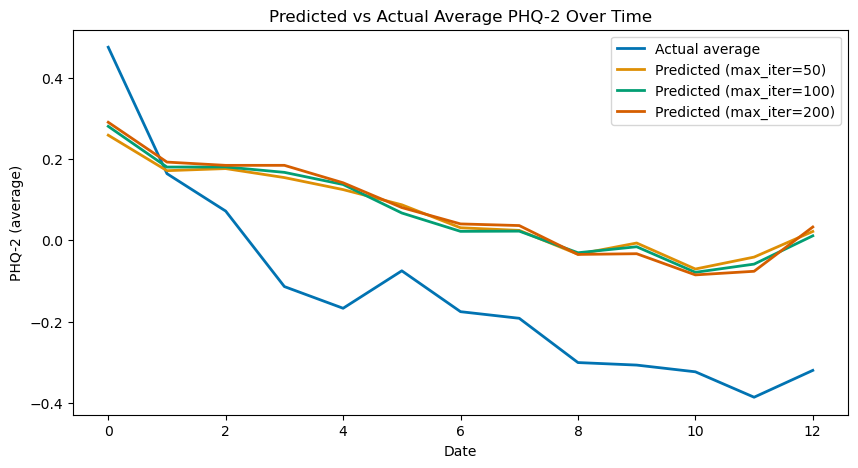

Using features: ['mhs_sum', 'mobility', 'mobility_radius', 'unreturned_calls', 'call_duration', 'call_count', 'aggregate_communication', 'interaction_diversity', 'missed_interactions', 'sms_count', 'sms_length', 'gad7_5', 'support', 'sds_2', 'alc_2', 'alc_3', 'alc_sum', 'sleep_1', 'gad_cat', 'gad7_4', 'gad7_2', 'gad7_8', 'gad7_sum', 'sds_3', 'income_satisfaction', 'alc_1', 'gad7_3', 'sleep_3', 'stress', 'gad7_6', 'education', 'sds_1', 'gad7_1', 'mood_1', 'gad7_7', 'sleep_2', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'cohort_nan', 'gender_0.0', 'gender_1.0', 'gender_nan', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'marital_status_nan', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'race_nan', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'season_nan', 'season_num_1.0', 'season_num_2.0', 'season_num_3.0', 'season_num_4.0', 'season_num_nan', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bi

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_50000/2889504030.py:11: DtypeWarning:

Columns (139) have mixed types. Specify dtype option on import or set low_memory=False.



,feature,importance_mean,importance_std
104,bin_clin,0.059528,0.014384
90,age,0.029755,0.005001
27,temp_median,0.029546,0.004436
107,6wks_depressed_binary,0.022157,0.004656
50,sds_3,0.018512,0.005047
55,stress,0.017149,0.008569
106,start_depressed_binary,0.014175,0.020107
33,temp_std,0.012937,0.003557


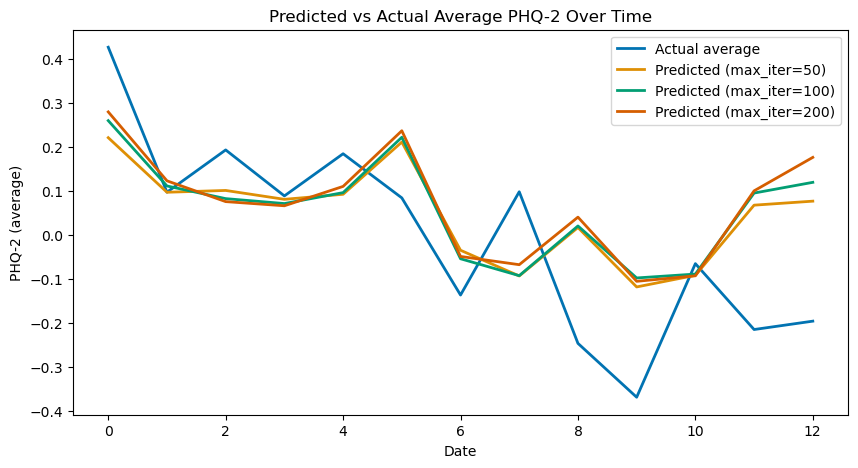

Using features: ['hours_powered_vehicle_hr', 'distance_high_speed_transportation_hr', 'distance_powered_vehicle_hr', 'distance_high_speed_transportation', 'distance_active_hr', 'hours_of_sleep_hr', 'hours_powered_vehicle', 'cloud_cover_IQR', 'hours_of_sleep', 'hours_high_speed_transportation', 'hours_active', 'distance_active', 'mhs_sum', 'location_variance', 'distance_walking_hr', 'distance_walking', 'location_variance_hr', 'hours_walking', 'distance_powered_vehicle', 'precip_sum', 'dew_point_std', 'dew_point_IQR', 'hours_active_hr', 'hours_high_speed_transportation_hr', 'came_to_work', 'temp_mean', 'dew_point_mean', 'temp_median', 'cloud_cover_std', 'humidity_mean', 'temp_IQR', 'dew_point_median', 'humidity_IQR', 'temp_std', 'humidity_median', 'cloud_cover_median', 'humidity_std', 'cloud_cover_mean', 'gad7_5', 'support', 'sds_2', 'alc_2', 'alc_3', 'alc_sum', 'sleep_1', 'gad_cat', 'gad7_4', 'gad7_2', 'gad7_8', 'gad7_sum', 'sds_3', 'income_satisfaction', 'alc_1', 'gad7_3', 'sleep_3', '

,feature,importance_mean,importance_std
22,gad7_sum,0.251790,0.012989
29,gad7_6,0.217623,0.011070
65,age,0.072678,0.007295
81,month,0.039122,0.004256
21,gad7_8,0.034774,0.002987
19,gad7_4,0.023405,0.002770
14,alc_2,0.018310,0.002870
23,sds_3,0.018177,0.002709


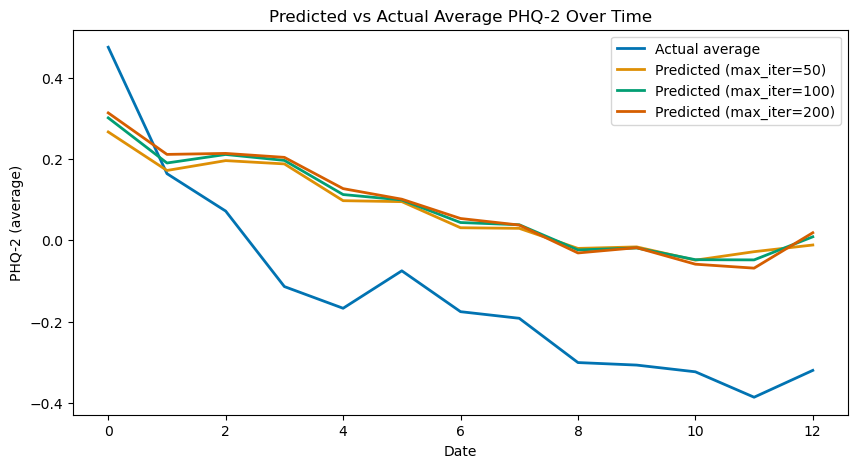

Using features: ['mhs_sum', 'mobility', 'mobility_radius', 'unreturned_calls', 'call_duration', 'call_count', 'aggregate_communication', 'interaction_diversity', 'missed_interactions', 'sms_count', 'sms_length', 'gad7_5', 'support', 'sds_2', 'alc_2', 'alc_3', 'alc_sum', 'sleep_1', 'gad_cat', 'gad7_4', 'gad7_2', 'gad7_8', 'gad7_sum', 'sds_3', 'income_satisfaction', 'alc_1', 'gad7_3', 'sleep_3', 'stress', 'gad7_6', 'education', 'sds_1', 'gad7_1', 'mood_1', 'gad7_7', 'sleep_2', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'cohort_nan', 'gender_0.0', 'gender_1.0', 'gender_nan', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'marital_status_nan', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'race_nan', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'season_nan', 'season_num_1.0', 'season_num_2.0', 'season_num_3.0', 'season_num_4.0', 'season_num_nan', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bi

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_50000/2889504030.py:11: DtypeWarning:

Columns (139) have mixed types. Specify dtype option on import or set low_memory=False.



,feature,importance_mean,importance_std
104,bin_clin,0.066032,0.017876
106,start_depressed_binary,0.038098,0.017221
90,age,0.034408,0.007529
50,sds_3,0.022916,0.010412
33,temp_std,0.018544,0.004209
58,sds_1,0.010106,0.002628
67,marital_status_1.0,0.007510,0.002586
29,humidity_mean,0.007506,0.003006


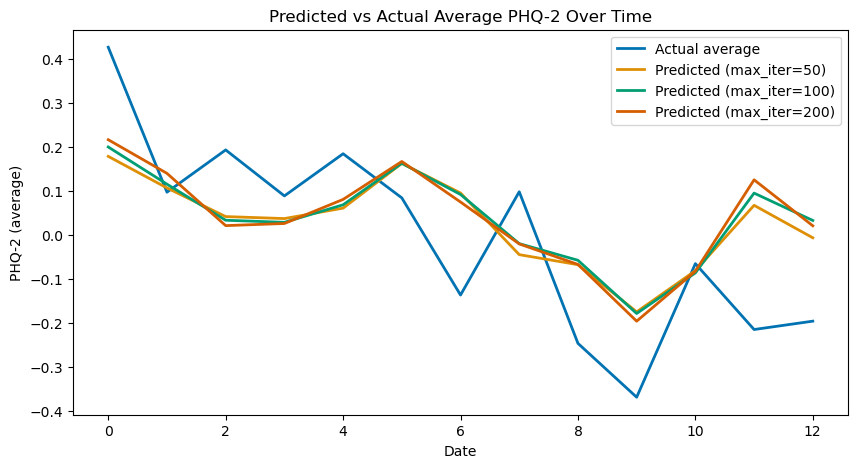

Using features: ['hours_powered_vehicle_hr', 'distance_high_speed_transportation_hr', 'distance_powered_vehicle_hr', 'distance_high_speed_transportation', 'distance_active_hr', 'hours_of_sleep_hr', 'hours_powered_vehicle', 'cloud_cover_IQR', 'hours_of_sleep', 'hours_high_speed_transportation', 'hours_active', 'distance_active', 'mhs_sum', 'location_variance', 'distance_walking_hr', 'distance_walking', 'location_variance_hr', 'hours_walking', 'distance_powered_vehicle', 'precip_sum', 'dew_point_std', 'dew_point_IQR', 'hours_active_hr', 'hours_high_speed_transportation_hr', 'came_to_work', 'temp_mean', 'dew_point_mean', 'temp_median', 'cloud_cover_std', 'humidity_mean', 'temp_IQR', 'dew_point_median', 'humidity_IQR', 'temp_std', 'humidity_median', 'cloud_cover_median', 'humidity_std', 'cloud_cover_mean', 'gad7_5', 'support', 'sds_2', 'alc_2', 'alc_3', 'alc_sum', 'sleep_1', 'gad_cat', 'gad7_4', 'gad7_2', 'gad7_8', 'gad7_sum', 'sds_3', 'income_satisfaction', 'alc_1', 'gad7_3', 'sleep_3', '

In [ ]:
from sklearn.model_selection import GroupShuffleSplit
from sklearn.inspection import permutation_importance


max_iter_list = [50, 100, 200]
colors = sns.color_palette("colorblind")
target = 'phq2_sum'

for name in ['v1_day','v2_day','v1_week','v2_week']:
	print(name)
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	clean_df = df.dropna(subset=target)
	X = clean_df.drop(columns=[col for col in clean_df.columns if 'phq' in col or col in id_columns or 'Unnamed' in col])
	X = X.select_dtypes(include=('int64', 'float64'))
	y = clean_df[target]
	print(f'Length of DF originally: {len(df)} \nAnd after dropping NA target columns: {len(clean_df)}')
	
	
	splitter = GroupShuffleSplit(test_size=0.2, n_splits=1, random_state=42)
	train_idx, test_idx = next(splitter.split(X, y, groups=clean_df['num_id']))

	X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
	y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]


	print(f"Training sample size: {X_train.shape[0]}")
	print(f"Test sample size: {X_test.shape[0]}")
	print(f"Number of features: {X_train.shape[1]}")

	fig, ax = plt.subplots(figsize=(10, 5))

	# baseline (actual average PHQ2)
	df_actual = df.loc[X_test.index].copy()
	avg_actual = df_actual.groupby("week")[target].mean()
	avg_actual.plot(color=colors[0], label="Actual average", linewidth=2, ax=ax)

	for idx, max_iter in enumerate(max_iter_list):
		hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
		hgbt.fit(X_train, y_train)
		y_pred = hgbt.predict(X_test)

		df_pred = df.loc[X_test.index].copy()
		df_pred["y_pred"] = y_pred

		avg_pred = df_pred.groupby("week")["y_pred"].mean()
		avg_pred.plot(
			color=colors[idx + 1],
			label=f"Predicted (max_iter={max_iter})",
			linewidth=2,
			ax=ax,
		)

		if max_iter == max(max_iter_list):
			result = permutation_importance(
				hgbt, X_test, y_test, 
				n_repeats=10, 
				random_state=42,
				n_jobs=-1
			)
			feat_importance_df = pd.DataFrame({
				'feature': X_test.columns,
				'importance_mean': result.importances_mean,
				'importance_std': result.importances_std
			}).sort_values('importance_mean', ascending=False)

			save_path = os.path.join(brighten_dir, f'{name}_feature_importances_maxIter{max_iter}.csv')
			feat_importance_df.to_csv(save_path, index=False)
			display(feat_importance_df.head(8))


	ax.set(
		title="Predicted vs Actual Average PHQ-2 Over Time",
		xlabel="Date",
		ylabel="PHQ-2 (average)",
	)
	ax.legend()
	plt.show()
	print(f'Using features: {X.columns.to_list()}')


# Trying only using only strongly correlated features

v1_day
Length of DF originally: 10355 
And after dropping NA target columns: 10355
Training sample size: 8277
Test sample size: 2078
Number of features: 34


,feature,importance_mean,importance_std
11,day,0.044481,0.007497
4,gad7_7,0.043002,0.008008
2,bin_clin,0.042006,0.009348
6,gad7_4,0.038448,0.004639
24,mhs_sum,0.031281,0.009495
18,mhs_4,0.012232,0.002442


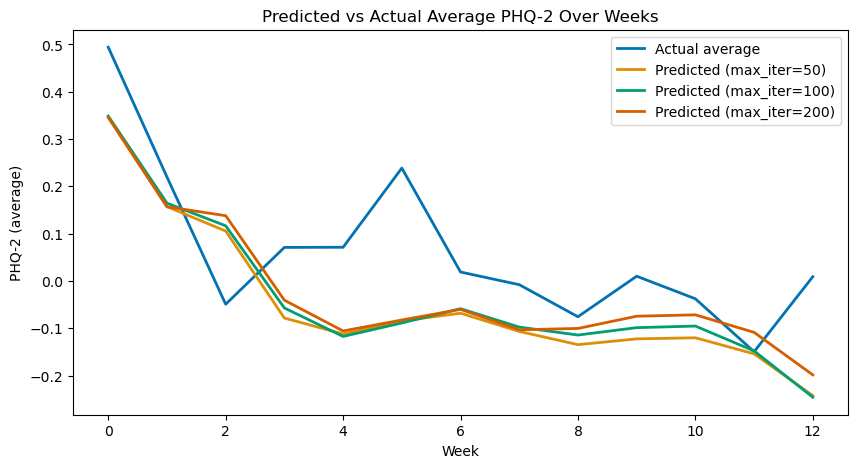

v2_day
Length of DF originally: 5116 
And after dropping NA target columns: 5116
Training sample size: 4075
Test sample size: 1041
Number of features: 30


,feature,importance_mean,importance_std
26,day,0.028987,0.019064
23,mhs_4,0.017786,0.005424
13,bin_clin,0.008776,0.014483
15,sleep_3,0.005676,0.001329
9,change_sum,0.005146,0.001853
2,ending_week,0.004730,0.003189


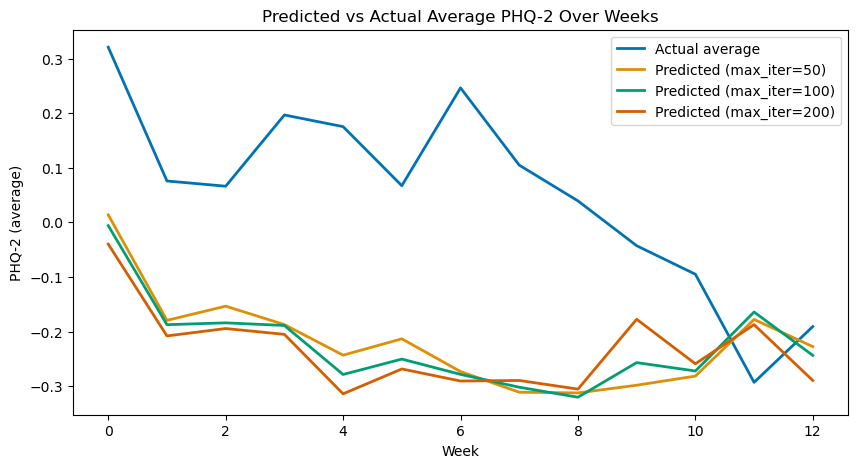

v1_week
Length of DF originally: 10355 
And after dropping NA target columns: 10355
Training sample size: 8277
Test sample size: 2078
Number of features: 30


,feature,importance_mean,importance_std
2,bin_clin,0.039730,0.006164
24,mhs_sum,0.038674,0.010237
11,day,0.038572,0.008770
4,gad7_7,0.032916,0.003282
1,gad7_sum,0.017520,0.005647
5,gad7_8,0.016374,0.003262


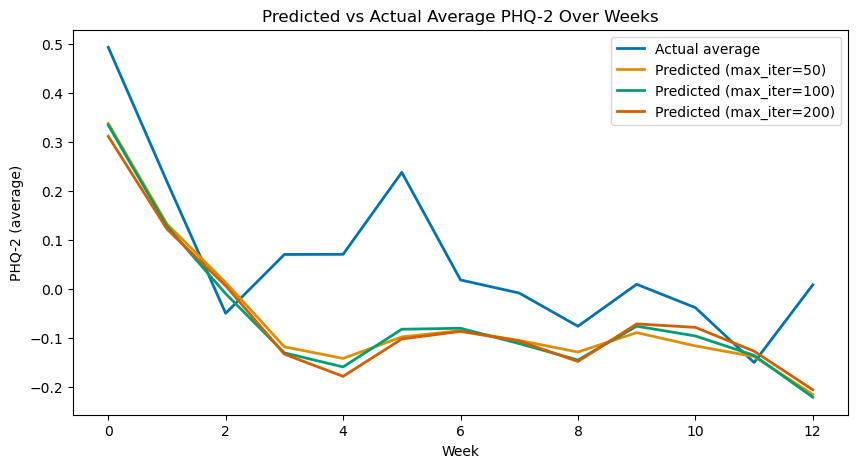

v2_week
Length of DF originally: 5116 
And after dropping NA target columns: 5116
Training sample size: 4075
Test sample size: 1041
Number of features: 29


,feature,importance_mean,importance_std
13,bin_clin,0.048861,0.024939
25,day,0.038878,0.016247
11,sds_3,0.008042,0.004474
22,mhs_4,0.005707,0.003823
18,sleep_3,0.005145,0.003318
14,sds_2,0.003593,0.003709


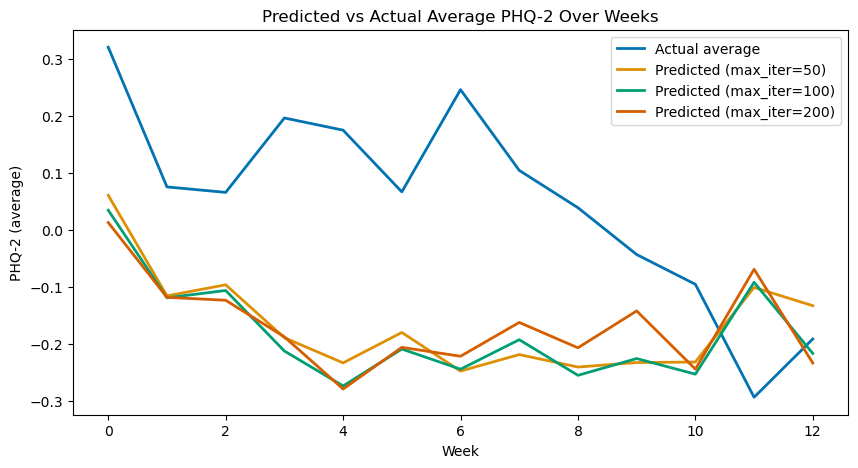

In [ ]:
max_iter_list = [50, 100, 200]
colors = sns.color_palette("colorblind")

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day','v1_week','v2_week']:
	print(name)
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	df = df.dropna(subset=y_col)
	corr_df = df.corr(numeric_only=True)[y_col].abs().sort_values(ascending=False)
	corr_df = pd.DataFrame(corr_df).reset_index(names=['column'])
	corr_df[y_col] = pd.to_numeric(corr_df[y_col])
	strong_corr = corr_df.where(corr_df[y_col] > 0.1).dropna(how='all')
	strong_corrs[name] = strong_corr['column'].to_list()
	X_cols = [col for col in strong_corrs[name] if similar_y_col not in col and 'Unnamed' not in col]
	X = df[['num_id']+X_cols]
	y = df[y_col]
	print(f'Length of DF originally: {len(df)} \nAnd after dropping NA target columns: {len(df)}')
	
	
	splitter = GroupShuffleSplit(test_size=0.2, n_splits=1, random_state=42)
	train_idx, test_idx = next(splitter.split(X, y, groups=df['num_id']))

	X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
	y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]


	print(f"Training sample size: {X_train.shape[0]}")
	print(f"Test sample size: {X_test.shape[0]}")
	print(f"Number of features: {X_train.shape[1]}")

	fig, ax = plt.subplots(figsize=(10, 5))

	# baseline (actual average PHQ2)
	df_actual = df.loc[X_test.index].copy()
	avg_actual = df_actual.groupby("week")[y_col].mean()
	avg_actual.plot(color=colors[0], label="Actual average", linewidth=2, ax=ax)

	for idx, max_iter in enumerate(max_iter_list):
		hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
		hgbt.fit(X_train, y_train)
		y_pred = hgbt.predict(X_test)

		df_pred = df.loc[X_test.index].copy()
		df_pred["y_pred"] = y_pred

		avg_pred = df_pred.groupby("week")["y_pred"].mean()
		avg_pred.plot(
			color=colors[idx + 1],
			label=f"Predicted (max_iter={max_iter})",
			linewidth=2,
			ax=ax,
		)

		
		if max_iter == max(max_iter_list):
			result = permutation_importance(
				hgbt, X_test, y_test, 
				n_repeats=10, 
				random_state=42,
				n_jobs=-1
			)
			feat_importance_df = pd.DataFrame({
				'feature': X_test.columns,
				'importance_mean': result.importances_mean,
				'importance_std': result.importances_std
			}).sort_values('importance_mean', ascending=False)

			save_path = os.path.join(brighten_dir, f'{name}_feature_importances_maxIter{max_iter}.csv')
			feat_importance_df.to_csv(save_path, index=False)
			display(feat_importance_df.head(6))




	ax.set(
		title="Predicted vs Actual Average PHQ-2 Over Weeks",
		xlabel="Week",
		ylabel="PHQ-2 (average)",
	)
	ax.legend()
	plt.show()

# Try doing by-subject with top correlated columns

For 13.0, X-cols: ['sleep_2', 'sleep_1', 'mood_1', 'season_fall', 'season_num_1.0', 'season_num_4.0', 'season_summer', 'support', 'mobility_radius', 'sms_length']


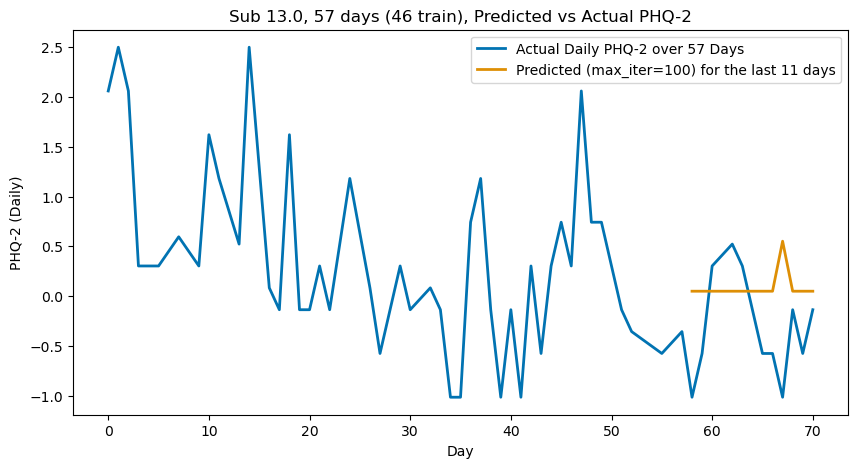

For 14.0, X-cols: ['sds_2', 'sds_3', 'sleep_2', 'mobility', 'stress', 'sds_1', 'mood_1', 'cohort_nan', 'cohort_PST', 'mobility_radius']


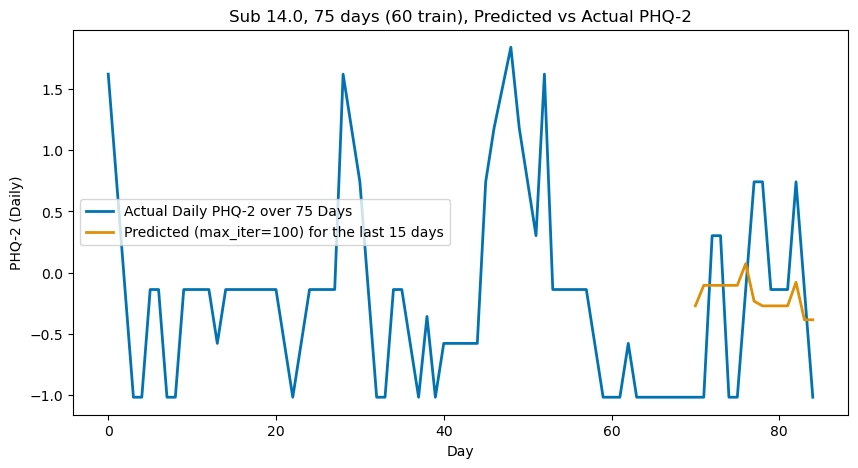

For 17.0, X-cols: ['sds_1', 'sds_3', 'stress', 'sds_2', 'sleep_3', 'support', 'missed_interactions', 'sleep_2', 'unreturned_calls', 'interaction_diversity']


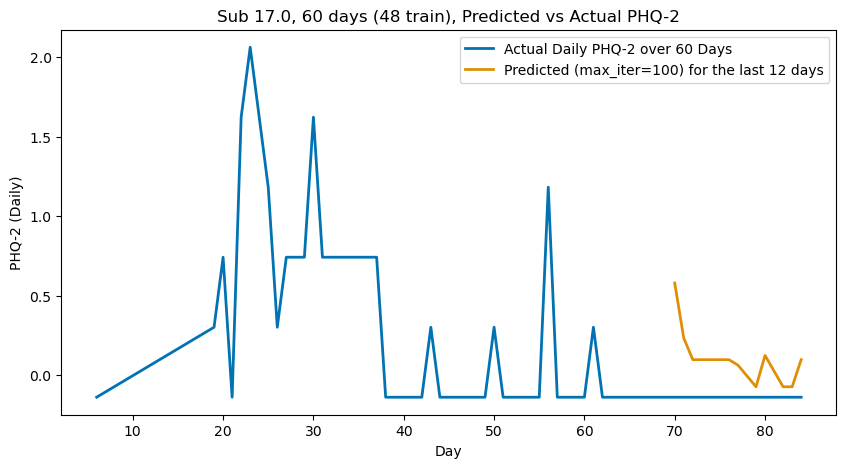

For 29.0, X-cols: ['sms_length', 'mobility_radius', 'sds_2', 'interaction_diversity', 'stress', 'sds_1', 'support', 'call_count', 'call_duration', 'missed_interactions']


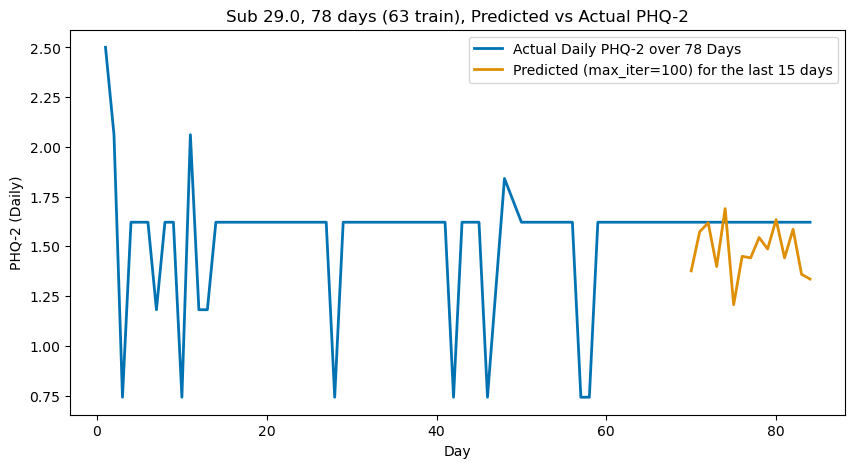

For 166.0, X-cols: ['hours_walking', 'dew_point_mean', 'distance_walking', 'cloud_cover_IQR', 'dew_point_median', 'humidity_median', 'hours_active_hr', 'distance_active_hr', 'distance_walking_hr', 'hours_active']


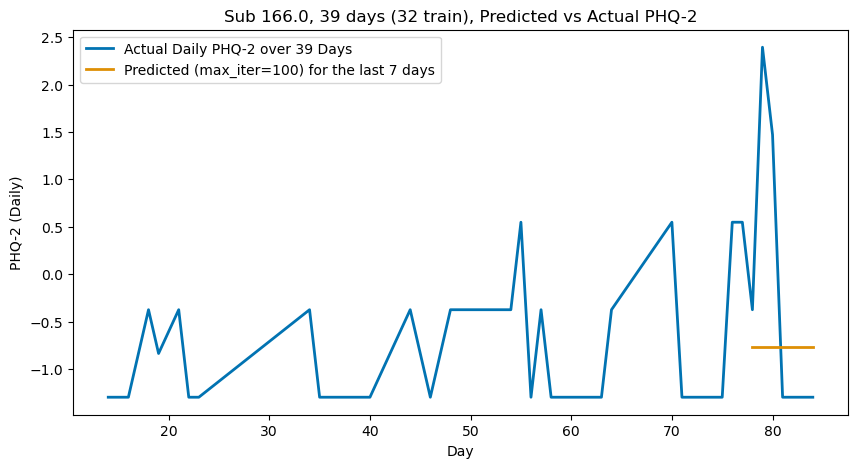

For 179.0, X-cols: ['sds_1', 'sds_2', 'sds_3', 'temp_std', 'humidity_IQR', 'temp_IQR', 'sleep_3', 'sleep_1', 'cloud_cover_mean', 'humidity_std']


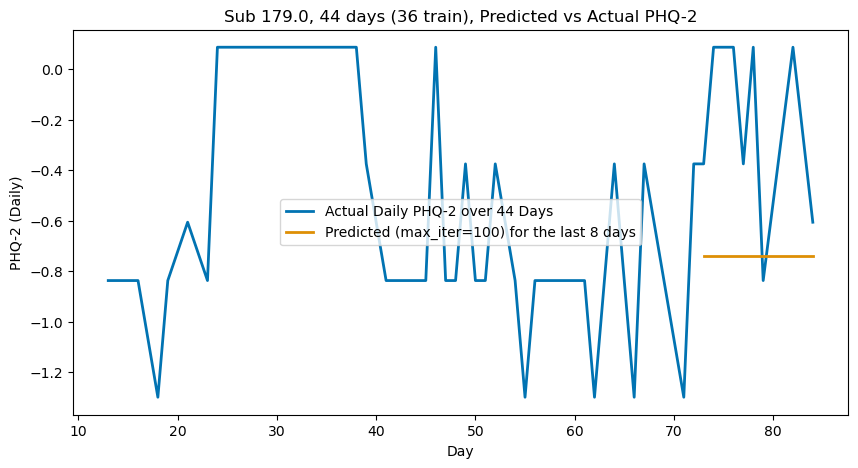

For 180.0, X-cols: ['dew_point_std', 'cloud_cover_std', 'cloud_cover_IQR', 'hours_of_sleep_hr', 'sds_3', 'dew_point_IQR', 'location_variance_hr', 'distance_walking', 'sds_2', 'support']


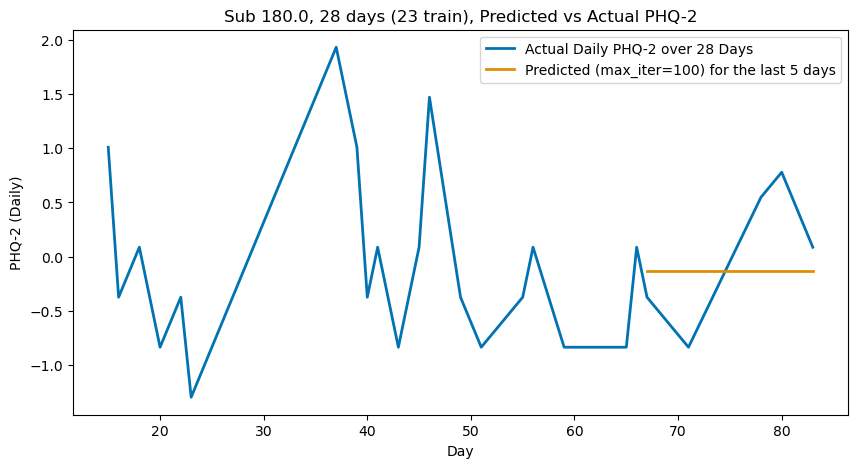

For 196.0, X-cols: ['hours_of_sleep_hr', 'hours_powered_vehicle_hr', 'hours_powered_vehicle', 'hours_of_sleep', 'distance_powered_vehicle_hr', 'distance_powered_vehicle', 'location_variance', 'stress', 'hours_active', 'hours_stationary_nhw']


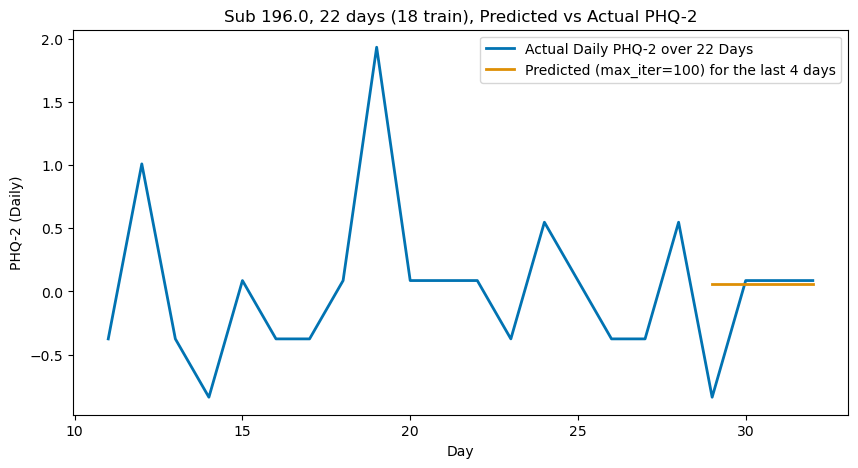

In [ ]:
max_iter_list = [100]
colors = sns.color_palette("colorblind")

demo_df = pd.read_csv(os.path.join(brighten_dir, f'demographics_clean.csv'))

test_perc = 0.2

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	for sub, sub_df in df.groupby('num_id'):
		if sub=='1735.0' or sub==1735.0:
			continue
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values('day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			sub_count+=1
			corr_df = sub_df_clean.corr(numeric_only=True)[y_col].abs().sort_values(ascending=False)
			corr_df = pd.DataFrame(corr_df).reset_index(names=['column'])
			corr_df[y_col] = pd.to_numeric(corr_df[y_col])
			strong_corr = corr_df.where(corr_df[y_col] > 0.1).dropna(how='all')
			clean_corr = [col for col in strong_corr['column'].to_list() if col not in id_columns and 'Unnamed' not in col and 'indicator' not in col and col not in ['week','month','day']]
			strong_corrs[sub] = clean_corr
			X_cols = [col for col in strong_corrs[sub] if similar_y_col not in col]
			X = sub_df_clean[X_cols[:10]]

			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]



			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'],
				y_col: y
			})
			
			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))
				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual Daily PHQ-2 over {days} Days",
					linewidth=2,
					ax=ax
				)

			for idx, max_iter in enumerate(max_iter_list):
				hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
				hgbt.fit(X_train, y_train)
				y_pred = hgbt.predict(X_test)

				pred_df = pd.DataFrame({
					'day': test_days_for_graphing,
					y_col : y_pred
				})

				if sub_count<5:
					pred_df.plot(
						x = 'day',
						y = y_col,
						color=colors[idx + 1],
						label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
						linewidth=2,
						ax=ax,
					)


				
			
			if sub_count<5:
				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual PHQ-2",
					xlabel="Day",
					ylabel="PHQ-2 (Daily)",
				)
				print(f'For {sub}, X-cols: {X.columns.to_list()}')
				ax.legend()
				plt.show()

				
			


# By subject using only top 15 ANOVA features for PHQ2

################### v1_day ###################
Using cols: ['mobility', 'mobility_radius', 'unreturned_calls', 'call_duration', 'call_count', 'aggregate_communication', 'interaction_diversity', 'missed_interactions', 'sms_count', 'sms_length', 'season_fall', 'season_winter', 'season_num_1.0', 'season_num_2.0']


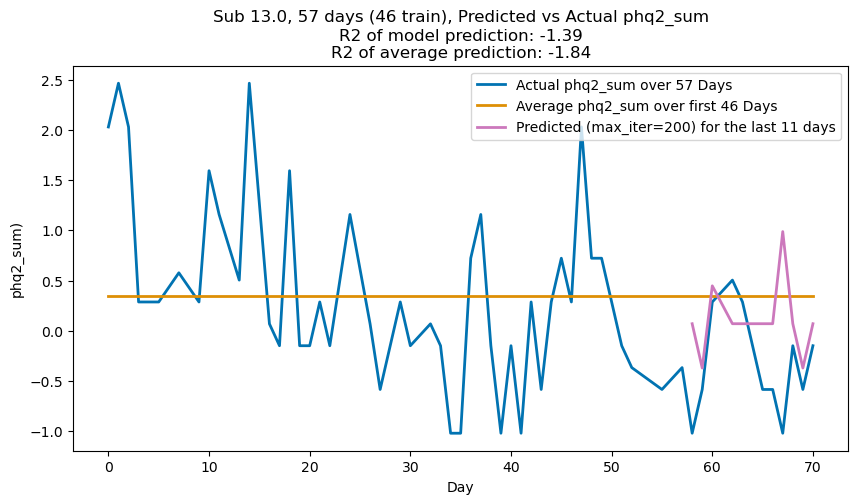

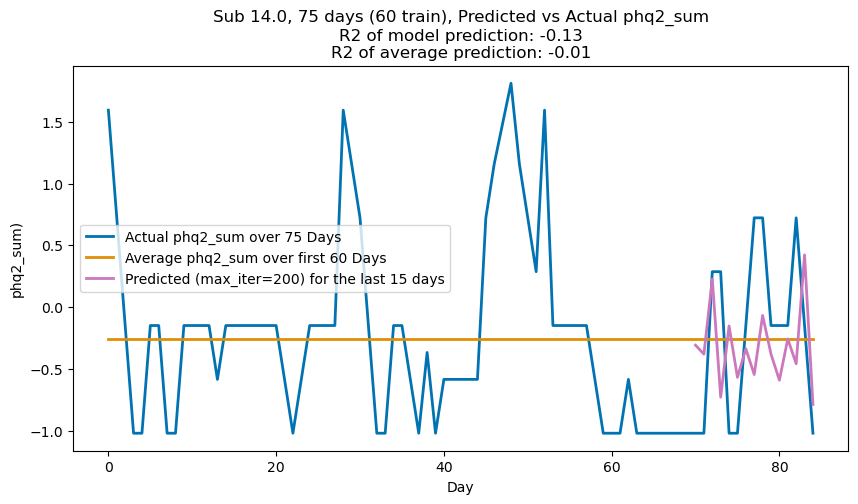

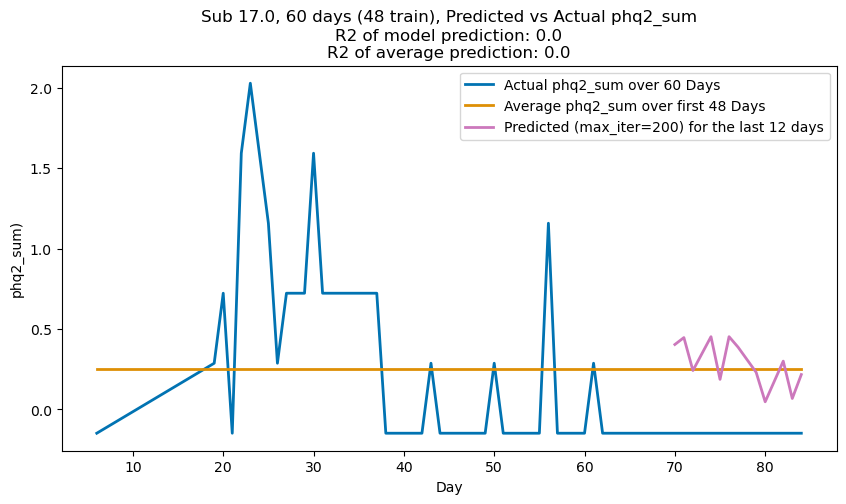

################### v2_day ###################
Using cols: ['distance_active_hr', 'hours_active', 'distance_active', 'location_variance', 'location_variance_hr', 'hours_walking', 'dew_point_std', 'dew_point_IQR', 'hours_active_hr', 'temp_mean', 'dew_point_mean', 'temp_median', 'humidity_mean', 'temp_IQR', 'dew_point_median', 'humidity_IQR', 'humidity_std']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_50000/3674246680.py:13: DtypeWarning:

Columns (139) have mixed types. Specify dtype option on import or set low_memory=False.



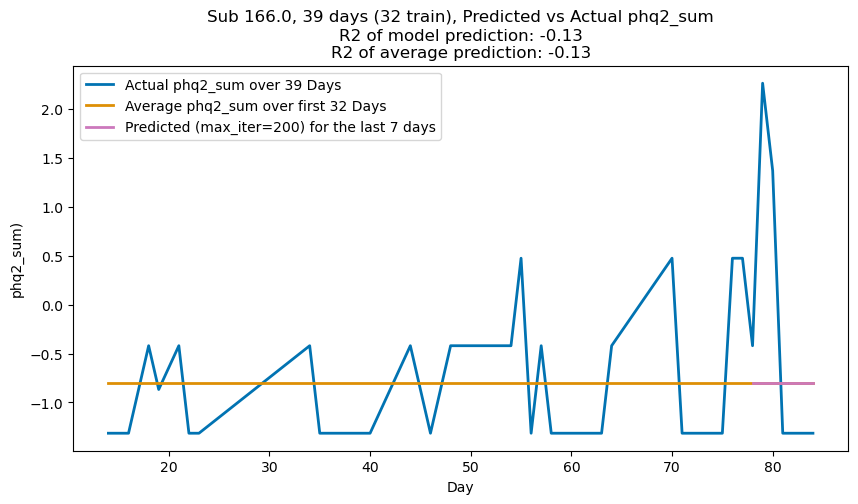

In [ ]:
max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day']:
	print(f'################### {name} ###################')
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	X_choices = anova_features[y_col][name]
	X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col]))
	X_cols_present = [col for col in df.columns if any(item in col for item in X_cols)]
	print(f'Using cols: {X_cols_present}')
	for sub, sub_df in df.groupby('num_id'):
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]


			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'],
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'day': sub_df_clean['day'],
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)

			pred_df = pd.DataFrame({
				'day': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='day',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'day',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}",
					xlabel="Day",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_r2_model_increase_from_avg.csv'))
			
		


# PHQ2 using sub-specific top 10

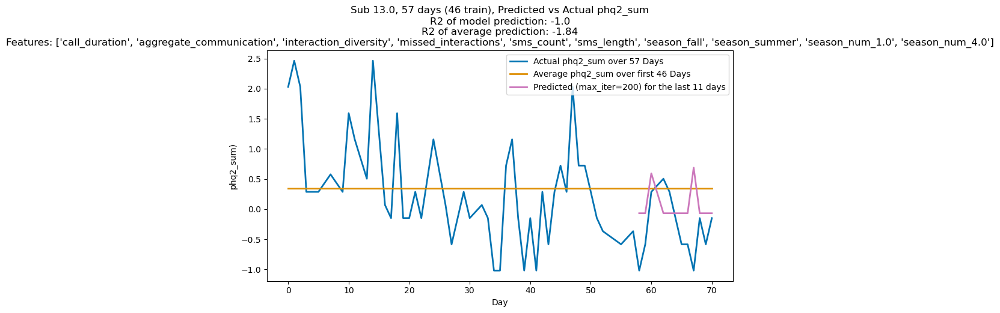

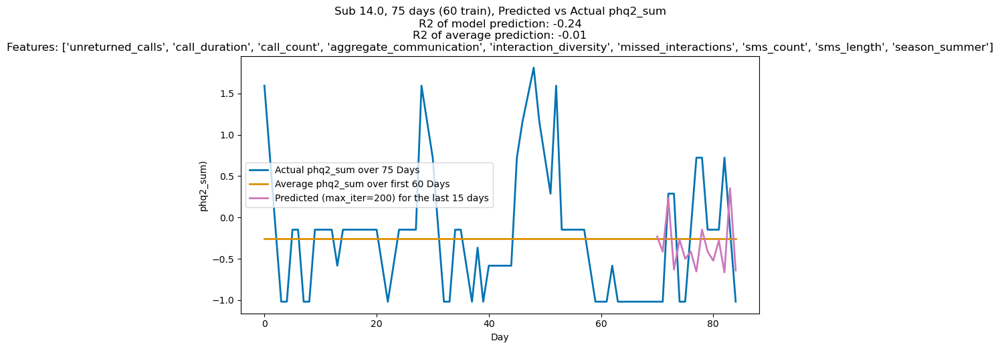

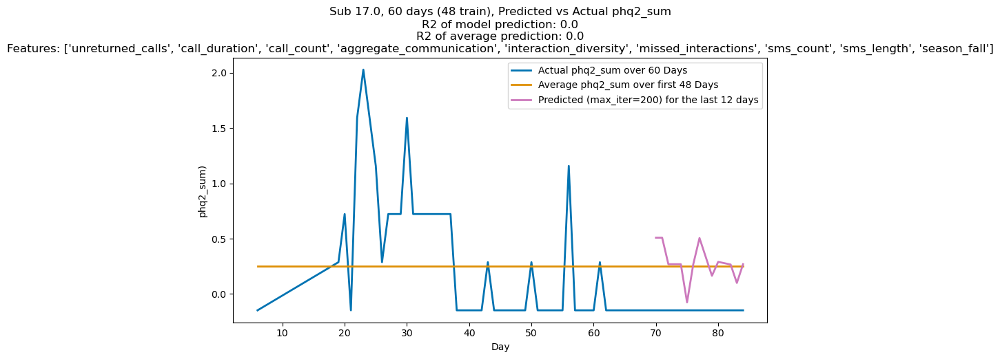

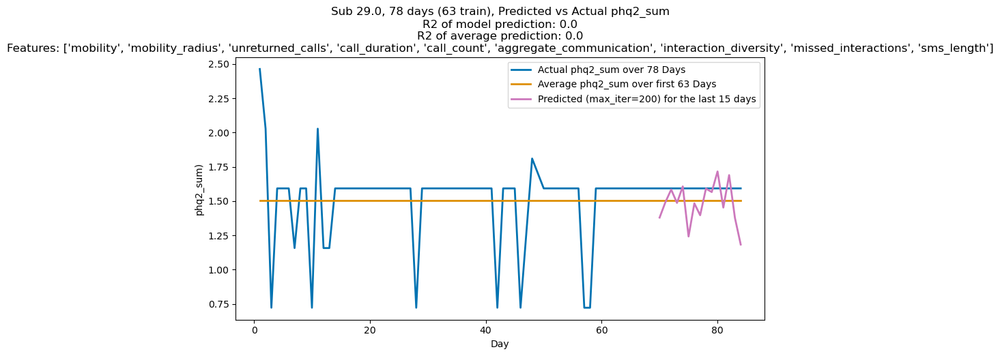

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_50000/2473295549.py:12: DtypeWarning:

Columns (139) have mixed types. Specify dtype option on import or set low_memory=False.



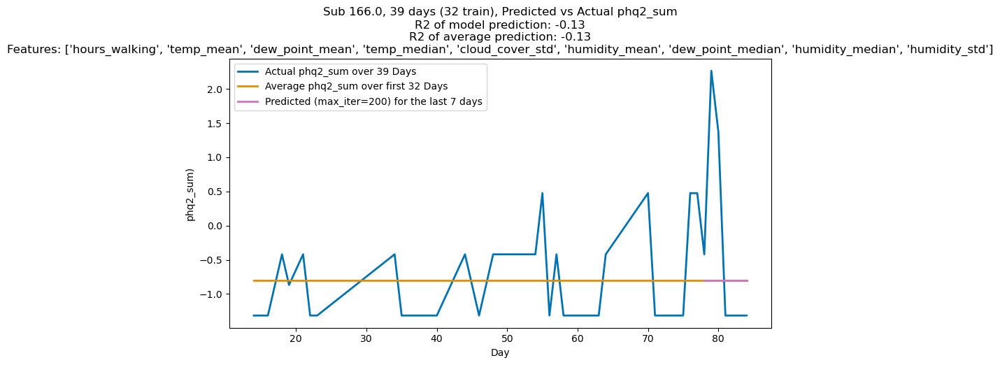

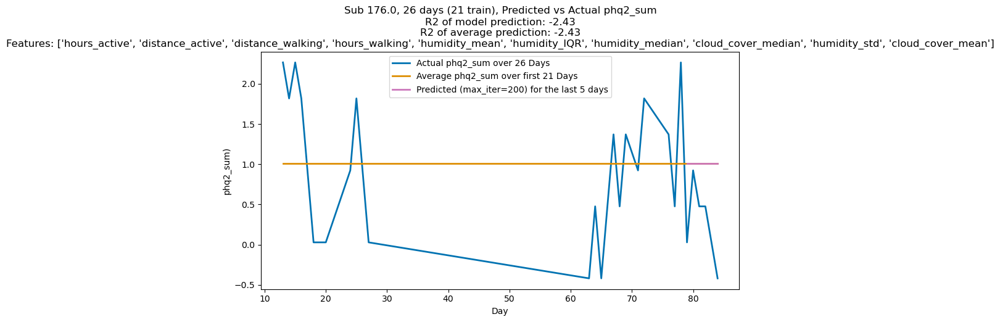

In [ ]:
max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq2_sum'
similar_y_col = 'phq'
for name in ['v1_day','v2_day']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	for sub, sub_df in df.groupby('num_id'):
		if sub not in top_features[y_col][name]:
			continue
		X_choices = top_features[y_col][name][sub]
		X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col and col not in ['month','day']]))
		X_cols_present = [col for col in sub_df.columns if col in X_cols]
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='day', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			train_days_for_graphing = sub_df_clean['day'][:train_num]
			test_days_for_graphing = sub_df_clean['day'][train_num:]



			# build your actual_df as before
			actual_df = pd.DataFrame({
				'day': sub_df_clean['day'].copy(),
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'day': sub_df_clean['day'].copy(),
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)

			pred_df = pd.DataFrame({
				'day': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='day',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='day',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'day',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}\nFeatures: {X_cols_present}",
					xlabel="Day",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_sub-specific_r2_model_increase_from_avg.csv'))
			
		


# PHQ9 Using top 15

Using cols: ['unreturned_calls', 'call_duration', 'call_count', 'aggregate_communication', 'interaction_diversity', 'missed_interactions', 'sms_count', 'sms_length', 'phq2_1', 'phq2_2', 'phq2_sum', 'season_fall', 'season_winter', 'season_num_1.0', 'phq2_bin']


,unreturned_calls,call_duration,call_count,aggregate_communication,interaction_diversity,missed_interactions,sms_count,sms_length,phq2_1,phq2_2,phq2_sum,season_fall,season_winter,season_num_1.0,phq2_bin
79,NaN,-0.504248,-0.771712,-0.681185,-1.296979,-0.525681,-0.609210,-0.587834,-0.565645,-0.135709,-0.365619,1.0,0.0,1.0,1.0
83,-0.511046,0.766962,-0.469877,-0.385984,0.310149,-0.525681,-0.341211,-0.311136,NaN,NaN,NaN,1.0,0.0,1.0,NaN
96,-0.511046,-0.363648,-0.168043,-0.451585,-0.378620,-0.525681,-0.441711,-0.211061,-0.983515,0.695877,-0.147992,1.0,0.0,1.0,1.0
91,0.083486,1.806162,0.586543,-0.221984,0.310149,0.735722,-0.290961,-0.260767,-0.147775,0.695877,0.287263,1.0,0.0,1.0,1.0
92,0.083486,-0.504248,-0.771712,-0.500785,-0.608210,-0.105213,-0.424961,-0.438715,NaN,NaN,NaN,1.0,0.0,1.0,NaN
93,-0.511046,-0.486818,-0.620794,-0.418785,-0.608210,-0.525681,-0.357961,-0.379731,-0.983515,-0.135709,-0.583246,1.0,0.0,1.0,1.0
94,0.083486,0.386219,-0.469877,-0.517185,0.769329,-0.105213,-0.475211,-0.327373,-0.983515,-0.135709,-0.583246,1.0,0.0,1.0,1.0
95,-0.511046,-0.491078,-0.620794,-0.664785,-1.067389,-0.525681,-0.609210,-0.587834,-0.983515,-0.967295,-1.018500,1.0,0.0,1.0,0.0
97,NaN,-0.504248,-0.771712,-0.435185,-0.608210,-0.525681,-0.357961,0.064975,-0.983515,-0.135709,-0.583246,1.0,0.0,1.0,1.0


[0.64655058 0.64655058 0.64655058 0.64655058 0.64655058 0.64655058
 0.64655058 0.64655058 0.64655058]


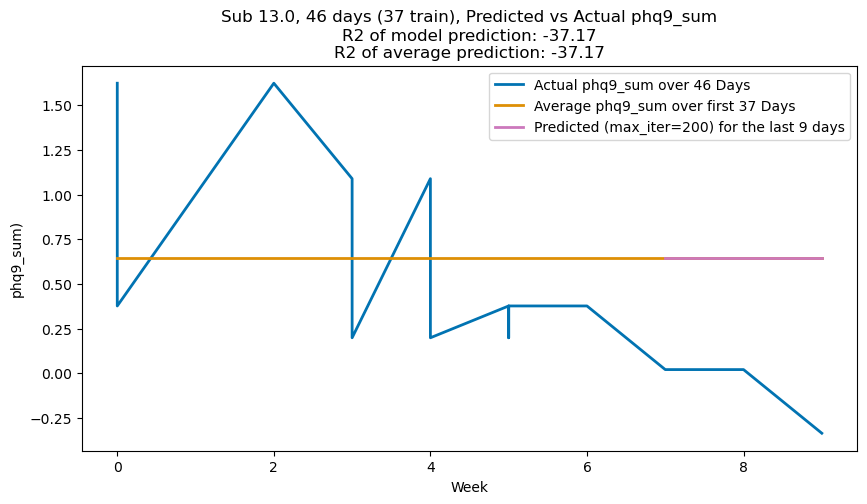

,unreturned_calls,call_duration,call_count,aggregate_communication,interaction_diversity,missed_interactions,sms_count,sms_length,phq2_1,phq2_2,phq2_sum,season_fall,season_winter,season_num_1.0,phq2_bin
168,-0.511046,0.764638,-0.168043,1.008020,-0.14903,-0.105213,1.049034,0.772792,-0.983515,-0.967295,-1.018500,1.0,0.0,1.0,0.0
176,-0.511046,-0.397345,-0.318960,-0.467985,-0.14903,-0.525681,-0.441711,-0.280318,0.687965,-0.135709,0.287263,1.0,0.0,1.0,1.0
177,-0.511046,-0.459705,-0.469877,0.417618,-0.83780,-0.525681,0.479536,0.705854,-0.983515,-0.967295,-1.018500,1.0,0.0,1.0,0.0
178,-0.511046,-0.277661,-0.168043,0.007617,-0.37862,-0.105213,0.027288,-0.155721,-0.983515,-0.967295,-1.018500,1.0,0.0,1.0,0.0
179,-0.511046,-0.504248,-0.771712,-0.254784,-0.60821,-0.525681,-0.173712,-0.271702,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
181,NaN,-0.504248,-0.771712,0.302818,-0.83780,-0.525681,0.395787,0.661450,0.687965,0.695877,0.722517,1.0,0.0,1.0,1.0
180,-0.511046,-0.391535,-0.469877,-0.500785,-0.60821,-0.525681,-0.458461,-0.465225,0.687965,0.695877,0.722517,1.0,0.0,1.0,1.0
182,-0.511046,-0.488754,-0.620794,-0.500785,-0.37862,-0.525681,-0.441711,-0.460918,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0


[0.60226086 0.60226086 0.60226086 0.60226086 0.60226086 0.60226086
 0.60226086 0.60226086]


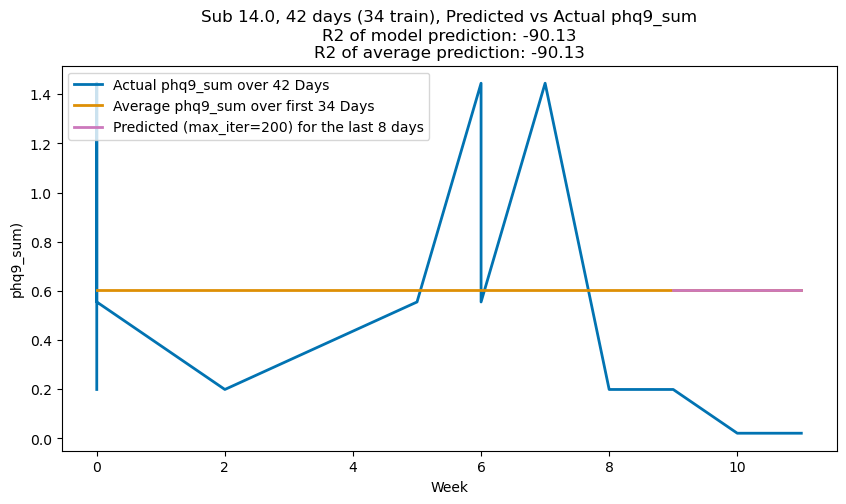

,unreturned_calls,call_duration,call_count,aggregate_communication,interaction_diversity,missed_interactions,sms_count,sms_length,phq2_1,phq2_2,phq2_sum,season_fall,season_winter,season_num_1.0,phq2_bin
258,0.678018,-0.434529,-0.318960,-0.517185,-0.378620,0.315255,-0.491961,-0.526199,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
259,0.083486,-0.491853,-0.620794,-0.517185,-0.378620,0.315255,-0.458461,-0.437721,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
260,-0.511046,-0.471325,-0.620794,-0.467985,-0.378620,-0.525681,-0.408211,-0.548401,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
269,-0.511046,3.083956,5.717729,0.138817,3.524407,0.315255,-0.491961,-0.410217,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
270,-0.511046,0.267697,0.737461,1.172021,0.539739,-0.105213,1.116034,2.706696,NaN,NaN,NaN,1.0,0.0,1.0,NaN
271,-0.511046,-0.224597,0.284709,-0.467985,0.310149,-0.525681,-0.508711,-0.502671,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
272,-0.511046,1.068690,0.133792,-0.566385,0.310149,-0.525681,-0.592460,-0.563313,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0
273,-0.511046,-0.300901,-0.017126,-0.582785,-0.378620,-0.525681,-0.592460,-0.536803,-0.147775,-0.135709,-0.147992,1.0,0.0,1.0,1.0


[0.39807535 0.39807535 0.39807535 0.39807535 0.39807535 0.39807535
 0.39807535 0.39807535]


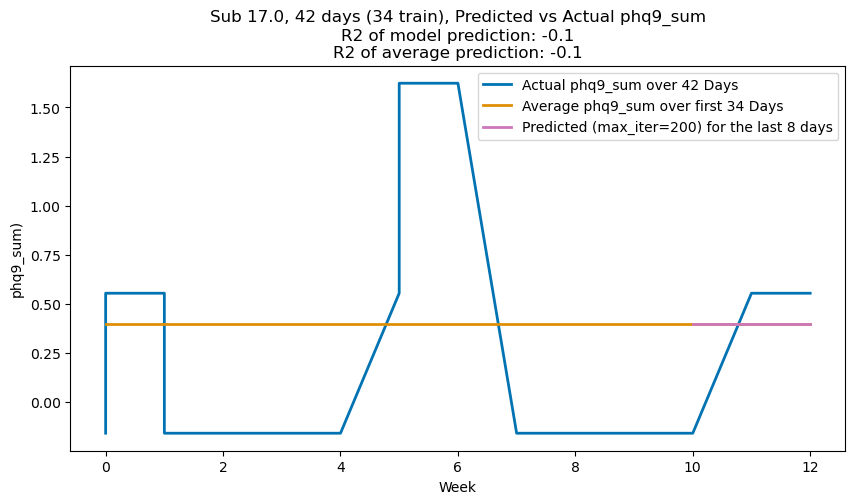

Using cols: ['temp_mean', 'dew_point_mean', 'temp_median', 'humidity_mean', 'dew_point_median', 'temp_std', 'humidity_median', 'cloud_cover_median', 'cloud_cover_mean', 'support', 'sds_2', 'sds_3', 'stress', 'mood_1', 'season_num_2.0']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_50000/3501725892.py:12: DtypeWarning:

Columns (139) have mixed types. Specify dtype option on import or set low_memory=False.



,temp_mean,dew_point_mean,temp_median,humidity_mean,dew_point_median,temp_std,humidity_median,cloud_cover_median,cloud_cover_mean,support,sds_2,sds_3,stress,mood_1,season_num_2.0
65,1.462356,1.429481,1.424376,-0.043208,1.440990,1.001237,0.111574,-0.566030,-0.201329,NaN,NaN,NaN,NaN,NaN,0.0
61,0.742794,0.742792,0.674394,-0.043208,0.706006,1.008164,-0.177061,-1.159827,-1.273707,NaN,NaN,NaN,NaN,NaN,0.0
62,0.719289,0.464537,0.806456,-0.646505,0.452210,0.994310,-0.869786,-0.689738,-0.838960,NaN,NaN,NaN,NaN,NaN,0.0
63,0.865659,0.593087,0.858629,-0.646505,0.561595,1.565779,-0.638878,-0.961895,-0.896926,NaN,NaN,NaN,NaN,NaN,0.0
64,1.162672,0.955959,1.322204,-0.465516,0.888674,2.047197,-0.177061,-1.159827,-1.244724,NaN,NaN,NaN,NaN,NaN,0.0
66,0.766298,0.910396,0.734175,0.258441,0.873048,0.100742,0.284755,0.621563,0.378334,NaN,NaN,NaN,NaN,NaN,0.0


[-1.14776997 -1.14776997 -1.14776997 -1.14776997 -1.14776997 -1.14776997]


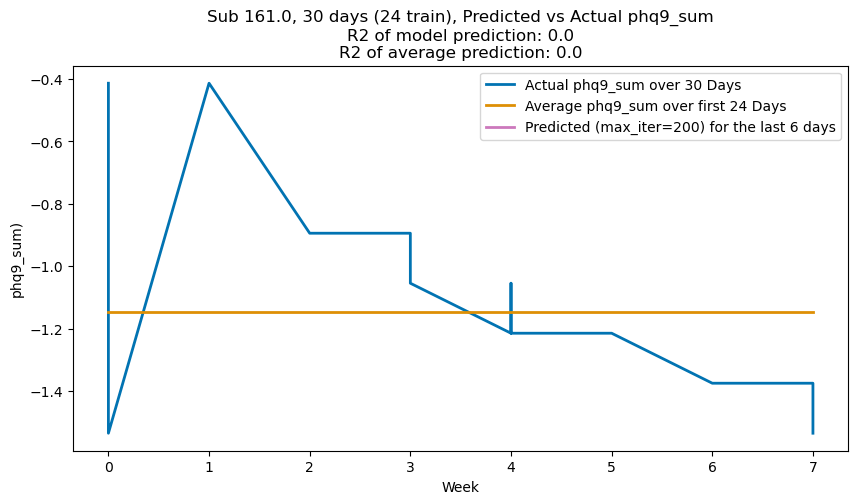

,temp_mean,dew_point_mean,temp_median,humidity_mean,dew_point_median,temp_std,humidity_median,cloud_cover_median,cloud_cover_mean,support,sds_2,sds_3,stress,mood_1,season_num_2.0
140,0.948459,-0.226492,0.891237,-2.396069,-0.200870,1.129385,-2.139781,-1.159827,-1.186758,-0.751451,-0.64224,-0.610811,-0.723708,-0.446226,0.0
144,0.520568,0.397278,0.464888,-0.465516,0.469453,-0.055113,-0.667741,0.534967,0.421809,-0.751451,-0.64224,-0.610811,-0.723708,-0.446226,0.0
145,0.432960,-0.449964,0.434182,-1.672111,-0.309716,0.544063,-2.255235,-1.159827,-1.012859,-0.028839,-0.64224,-0.610811,-0.723708,-0.446226,0.0
146,0.619929,-1.729505,0.470051,-3.542334,-1.750048,1.105141,-3.409776,-1.159827,-1.302691,-0.028839,-0.64224,-0.610811,-0.723708,-0.446226,0.0
147,0.651981,-1.194690,0.665155,-3.180356,-1.321666,1.164019,-3.121141,-1.159827,-1.070825,-0.028839,-0.64224,-0.610811,-0.723708,-0.446226,0.0
148,0.547812,-0.106077,0.459182,-1.430792,-0.275769,-0.072430,-2.139781,0.893719,0.871048,-0.028839,-0.64224,-0.610811,-0.723708,-0.446226,0.0
149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.028839,-0.64224,-0.610811,-0.723708,-0.446226,0.0
143,1.004283,-0.292394,0.845314,-2.486563,-0.515824,1.032408,-2.572734,-1.159827,-1.114300,-0.751451,-0.64224,-0.610811,-0.723708,-0.446226,0.0
150,0.285522,0.395108,0.198862,0.258441,0.374616,0.578697,0.342482,-1.135085,-0.694044,-0.028839,-0.64224,-0.610811,-0.723708,-0.446226,0.0


[-0.56464196 -0.56464196 -0.56464196 -0.56464196 -0.56464196 -0.56464196
 -0.56464196 -0.56464196 -0.56464196]


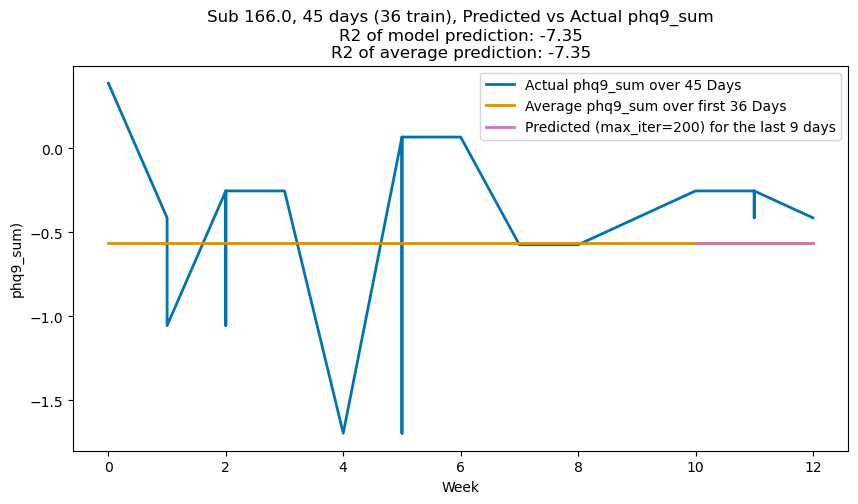

In [ ]:
max_iter_list = [100]
colors = sns.color_palette("colorblind")

test_perc = 0.2
r2_from_model = []

strong_corrs = {}
y_col = 'phq9_sum'
similar_y_col = 'phq9'
for name in ['v1_week','v2_week']:
	sub_count=0
	df=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
	X_choices = anova_features[y_col][name]
	X_cols = list(set([col for col in X_choices if similar_y_col not in col and 'Unnamed' not in col and col not in id_columns and 'indicator' not in col and col not in ['week','month','day']]))
	X_cols_present = [col for col in df.columns if any(item in col for item in X_cols)]
	print(f'Using cols: {X_cols_present}')
	for sub, sub_df in df.groupby('num_id'):
		sub_count+=1
		sub_df_clean = sub_df.dropna(subset=[y_col])
		sub_df_clean = sub_df_clean.sort_values(by='week', ascending=True)
		days = len(sub_df_clean)
		if days > 20:
			X = sub_df_clean[X_cols_present]
			y = sub_df_clean[y_col]
		
			test_num = int(days*test_perc)
			train_num = days - test_num
			X_train = X[:train_num]
			X_test = X[train_num:]
			y_train = y[:train_num]
			y_test = y[train_num:]

			test_days_for_graphing = sub_df_clean['week'][train_num:]

			# build your actual_df as before
			actual_df = pd.DataFrame({
				'week': sub_df_clean['week'].copy(),
				y_col: y
			})
			

			
			avg = y_train.mean()
			avg_df = pd.DataFrame({
					'week': sub_df_clean['week'].copy(),
					y_col : [avg]*days
				})
			
			hgbt = HistGradientBoostingRegressor(max_iter=max_iter, random_state=42)
			hgbt.fit(X_train, y_train)
			y_pred = hgbt.predict(X_test)
			

			pred_df = pd.DataFrame({
				'week': test_days_for_graphing,
				y_col : y_pred
			})
			
			r2_actual_vs_model = r2_score(y_test, pred_df[y_col])
			r2_actual_vs_avg = r2_score(y_test, avg_df[y_col][:test_num])
			
			r2_from_model.append([sub, r2_actual_vs_model, r2_actual_vs_avg, r2_actual_vs_model-r2_actual_vs_avg])

			if sub_count<5:
				display(X_test)
				print(y_pred)
				fig, ax = plt.subplots(figsize=(10, 5))


				actual_df.plot(
					x='week',
					y=y_col,
					color=colors[0],
					label=f"Actual {y_col} over {days} Days",
					linewidth=2,
					ax=ax
				)

				avg_df.plot(
					x='week',
					y=y_col,
					color=colors[1],
					label=f"Average {y_col} over first {train_num} Days",
					linewidth=2,
					ax=ax
				)

				pred_df.plot(
					x = 'week',
					y = y_col,
					color=colors[idx + 2],
					label=f"Predicted (max_iter={max_iter}) for the last {test_num} days",
					linewidth=2,
					ax=ax,
				)

				ax.set(
					title=f"Sub {sub}, {days} days ({train_num} train), Predicted vs Actual {y_col}\nR2 of model prediction: {round(r2_actual_vs_model,2)}\nR2 of average prediction: {round(r2_actual_vs_avg,2)}",
					xlabel="Week",
					ylabel=f"{y_col})",
				)
				ax.legend()
				plt.show()


	r2_from_model_df = pd.DataFrame(r2_from_model, columns=['sub', 'r2_actual_vs_model', 'r2_actual_vs_avg', 'r2_model_increase_from_avg'])
	r2_from_model_df.to_csv(os.path.join(results_dir, f'{name}_{y_col}_r2_model_increase_from_avg.csv'))
			
		


In [ ]:
for name in ['v1_day','v2_day','v1_week','v2_week']:
	r2_from_model_df=pd.read_csv(os.path.join(results_dir, f'{name}_r2_model_increase_from_avg.csv'))
	display(r2_from_model_df)
	fig = px.bar(r2_from_model_df, x='sub',y='r2_model_increase_from_avg',barmode='group')
	fig.show()


## trying HistGradientBoosting on my data


In [ ]:

y_cols = ['phq9_sum']
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}
model_dict = {}
time_cols = ['month','week','day']

for name in ['v1_week','v2_week']:
	model_dict[name] = {}
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		model_dict[name][y_col] = {}
		Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
		val_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_test_transformed.csv'))

		Xy=Xy.dropna(subset=[y_col])
		Xy=Xy.select_dtypes(include=('int64','float64'))
		y=Xy[y_col]
		baseline_cols_present = matches = [item for item in Xy.columns if any(col in item for col in baseline_cols)]
		y_cols_present = [item for item in Xy.columns if any(col in item for col in y_cols) or 'phq9' in item]
		drop_cols = [item for item in Xy.columns if 'Unnamed' in item or '_nan' in item or '_indicator' in item]

		for time in ['baseline','8wks','both']:
			print(f'\n{time.upper()}')
			model_dict[name][y_col][time] = {}
			if 'baseline' in time:
				X1=Xy[['num_id']+time_cols+baseline_cols_present].copy()
			elif '8wks' in time:
				X1 = Xy.drop(columns=baseline_cols_present+y_cols_present+drop_cols+['6wks_depressed_binary', 'depression_change_bin']).copy()
			else:
				X1=Xy.drop(columns=y_cols_present+drop_cols+['6wks_depressed_binary', 'depression_change_bin'])
			
			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)
			count=0
			print(f'X has {X1.shape[0]} observations, {X1.shape[1]} features')


			# print('models...')
			for model_name in models:
				model_dict[name][y_col][time][model_name] = {}
				model_dict[name][y_col][time][model_name]['model']=[]
				model_dict[name][y_col][time][model_name]['X_test']=[]
				model_dict[name][y_col][time][model_name]['r2_scores']=[]
				model_dict[name][y_col][time][model_name]['mae_scores']=[]
				model_dict[name][y_col][time][model_name]['y_pred']=[]
				model_dict[name][y_col][time][model_name]['y_test']=[]
				model_dict[name][y_col][time][model_name]['y_val']=[]
				model_dict[name][y_col][time][model_name]['y_valpred']=[]
				for train_idx, test_idx in gkf.split(X1, y, groups):
					X_train, X_test = X1.iloc[train_idx], X1.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
					model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
					model_dict[name][y_col][time][model_name]['X_test'].append(X_test)

					model = models[model_name][0]
					if y_col in ['change_cat','change_binary']:
						model= models[model_name][1]
					
					X_train_for_model = X_train.drop(columns=[col for col in time_cols if col in X_train.columns])
					if count==0:
						print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
						print(f'Features: {X_train_for_model.columns.to_list()}')
						print(f'Train Subjects: {set(list(X_train['num_id']))}')
						print(f'Train Subjects: {set(list(X_test['num_id']))}')
						if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
							print(f'All subjects in each set are unique')
						else:
							print(f"Overlapping subjects")
						count=1


					model.fit(X_train_for_model, y_train)
					assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
					model_dict[name][y_col][time][model_name]['model'].append(model)
					
					X_test_for_model = X_test.drop(columns=[col for col in time_cols if col in X_test.columns])
					y_pred = model.predict(X_test_for_model)
					model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

					

					r2 = r2_score(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
				
				X_val = val_df[[col for col in val_df.columns if col in X_test]]
				X_val_for_model = val_df[[col for col in X_val.columns if col in X_test_for_model]]
				X_val_for_model = X_val_for_model[X_test_for_model.columns]
				yval_pred = model.predict(X_val_for_model)
				model_dict[name][y_col][time][model_name]['y_valpred'].append(yval_pred)
				yval_true = val_df[y_col]
				model_dict[name][y_col][time][model_name]['y_val'].append(yval_true)
				
				r2 = r2_score(y_test, y_pred)
				print(f"FOR VAL:: {y_col} from {time} -- R²: {r2}")








				
	
		# if 'phq9_mean' in y_col:
		# 	phq9_base_col = [col for col in Xy.columns if 'phq9_sum_base' in col]
		# 	yy = pd.concat([Xy[phq9_base_col], y], axis=1)
		# 	yy=yy.dropna()
		# 	y_pred = yy[phq9_base_col]
		# 	y_test=yy['phq9_mean']
		# 	r2_base = r2_score(y_pred,y_test)
		# 	print(f"{y_col} predicted from phq9_sum_baseline survey -- mean R²: {round(np.mean(r2_base), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
		# 	model_dict[name]['baseline_phq9'] = {}
		# 	model_dict[name]['baseline_phq9']['r2'] = r2_base
			
	



####### v1_week #######

BASELINE
X has 7224 observations, 59 features
First CV
5779 observations in X_train, 1445 in X_test. 177 train subs, 43 test subs
Features: ['num_id', 'alc_2', 'phq9_9_base', 'phq9_6_base', 'gad7_5', 'gad7_3', 'phq9_2_base', 'gad7_sum', 'phq9_3_base', 'phq9_7_base', 'gad_cat', 'phq9_8_base', 'alc_sum', 'alc_3', 'income_satisfaction', 'phq9_1_base', 'phq9_4_base', 'gad7_2', 'gad7_7', 'gad7_4', 'phq9_sum_base', 'education', 'gad7_1', 'gad7_8', 'phq9_5_base', 'gad7_6', 'alc_1', 'gender_0.0', 'gender_1.0', 'gender_nan', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'marital_status_nan', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'race_nan', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']
Train Subjects: {1543.0, 13.0, 17.0, 22.0, 1559.0, 25.0, 29.0, 1571.0, 1577.0, 60.0, 73.0, 77.0, 1117.0, 94.0, 95.0, 105.0, 10

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_65104/1806773730.py:13: DtypeWarning:

Columns (139) have mixed types. Specify dtype option on import or set low_memory=False.



phq9_sum from baseline -- mean R²: -0.0413, mean MAE: 0.8079 of scores [-1.9-2.5]
FOR VAL:: phq9_sum from baseline -- R²: -0.21938794303454778

8WKS
X has 4552 observations, 69 features
First CV
3641 observations in X_train, 911 in X_test. 139 train subs, 36 test subs
Features: ['location_variance', 'hours_high_speed_transportation_hr', 'distance_active', 'distance_high_speed_transportation', 'distance_walking', 'dew_point_IQR', 'hours_of_sleep_hr', 'dew_point_std', 'hours_powered_vehicle', 'hours_powered_vehicle_hr', 'hours_of_sleep', 'hours_walking', 'distance_walking_hr', 'hours_high_speed_transportation', 'precip_sum', 'distance_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'came_to_work', 'distance_powered_vehicle', 'hours_active_hr', 'distance_powered_vehicle_hr', 'mhs_sum', 'location_variance_hr', 'hours_active', 'temp_std', 'temp_median', 'temp_mean', 'cloud_cover_mean', 'dew_point_mean', 'humidity_median', 'cloud_cover_std', 'humidity_std', 'temp_IQR'

# SHAP for the above predictive models

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.426


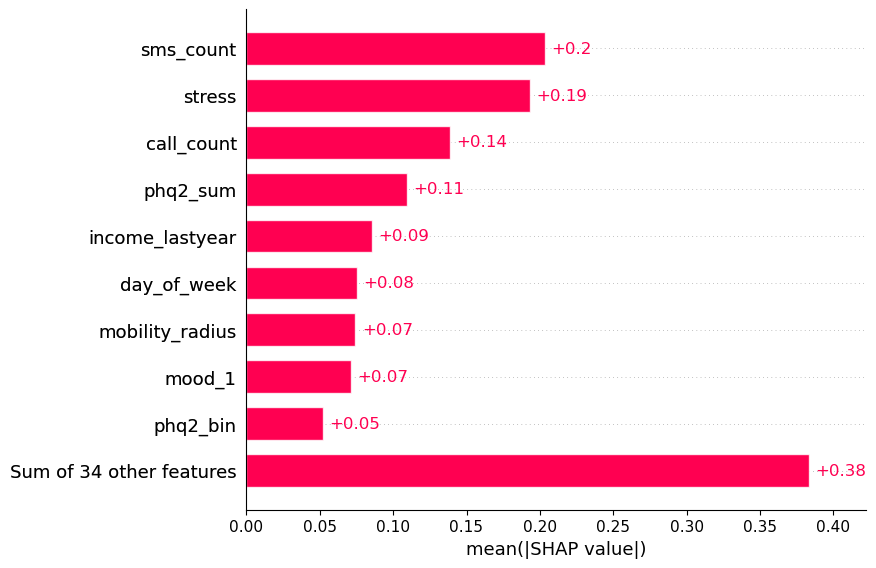

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.405


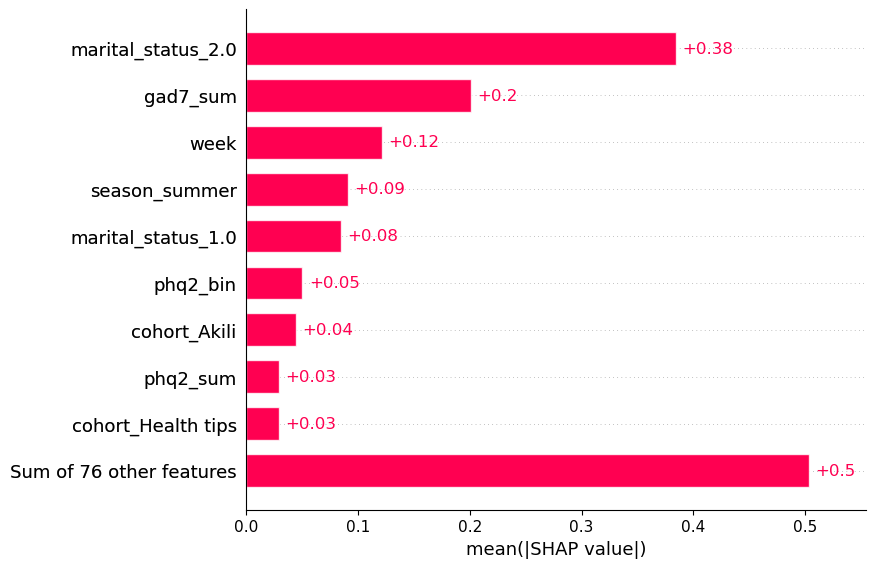

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.345


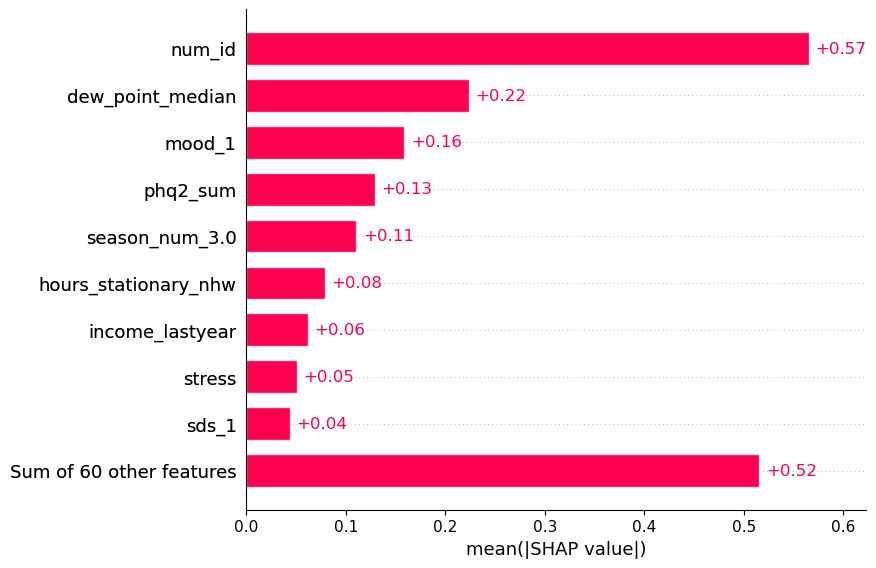

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.341


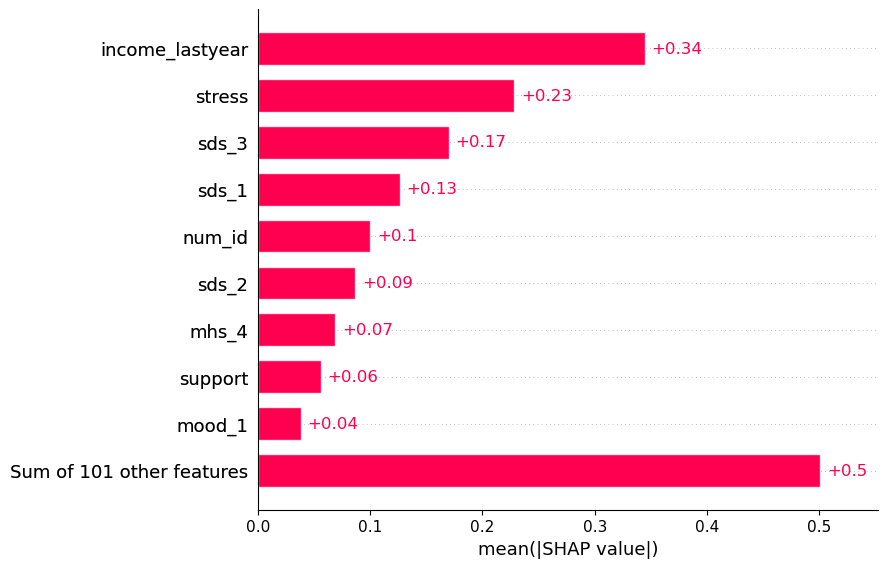

In [ ]:
# SHAP Printing -- do after above, can't run without first making results {}
import gc 

for name in ['v1_week', 'v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][time][model_name]['X_test'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  


# SHAP Printing and by-subject model predictions for test set - graphs of predicted vs. true

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.426


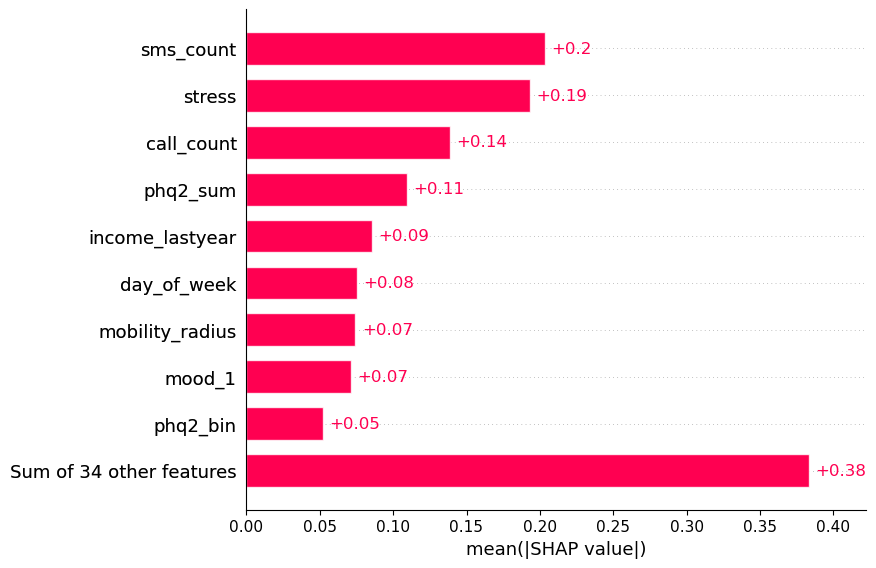

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.405


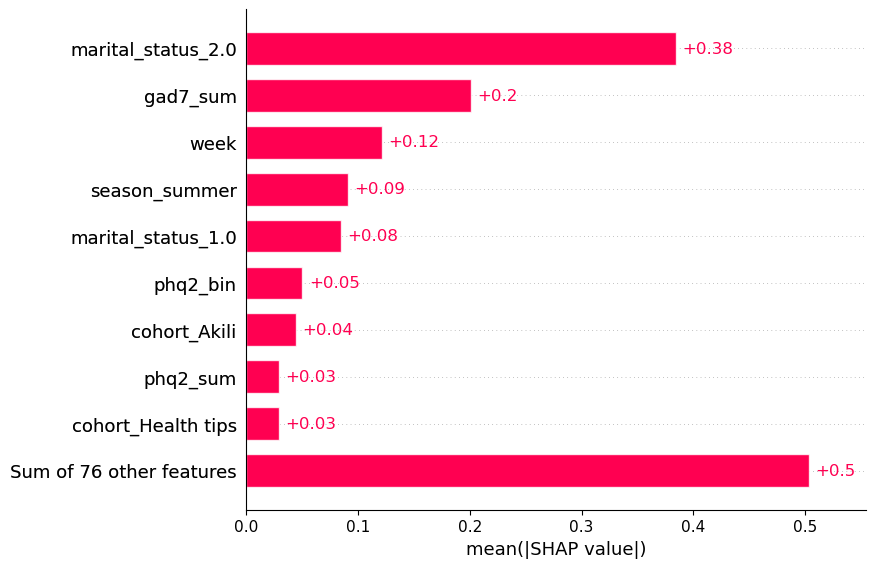

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.345


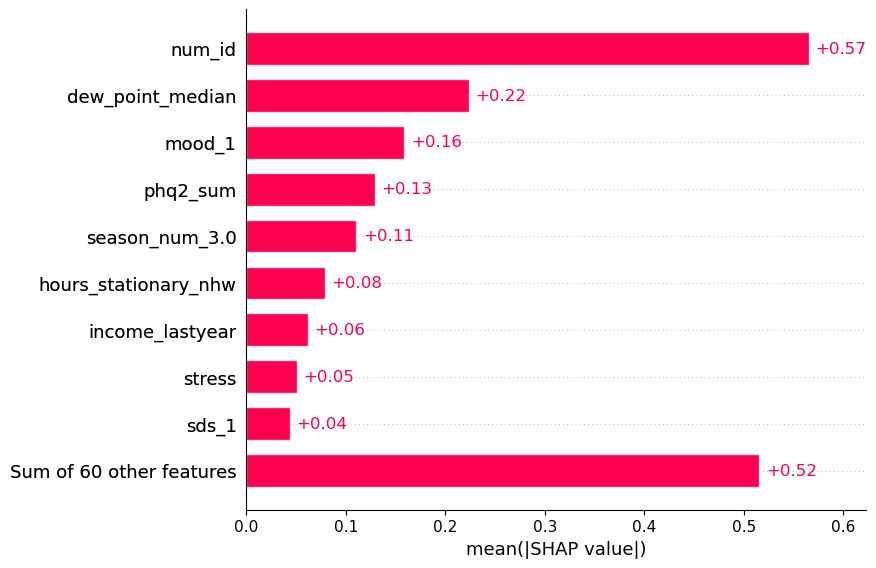

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.341


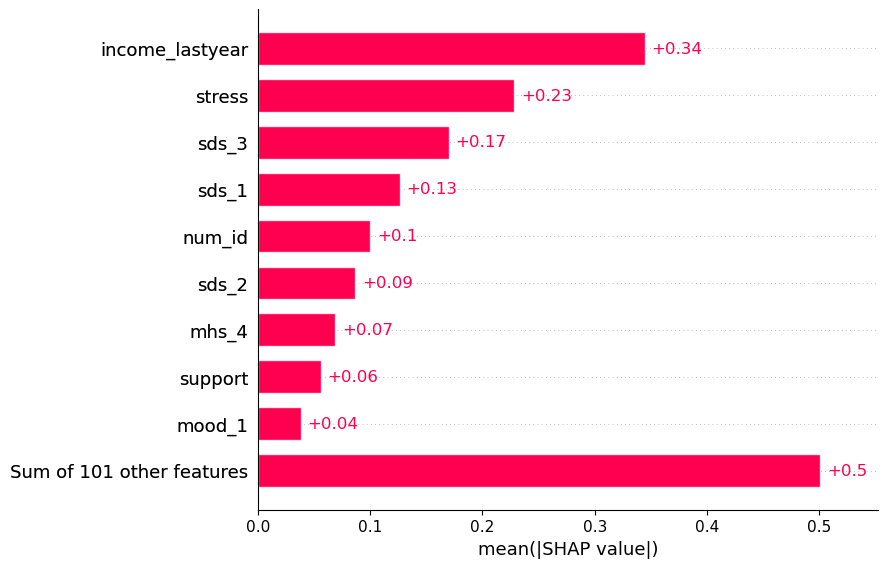

In [ ]:

import gc 

for name in ['v1_week', 'v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][time][model_name]['X_test'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i]
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))==0:
						continue

					sub_df = sub_df.sort_values(by='day')

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'For sub {sub}, using {X_test.shape[1]} {time} features,  pred. vs. actual {y_col} score -- Mean R2 = {mean_r2} over 5 CVs')

					fig.show()



			

# NO PHQ2 or other related variables (SDS, stress, mood)


In [8]:

y_cols = ['phq9_sum']
drop_survey_cols = ['phq2_1','phq2_2','phq2_sum','phq2_bin','sds_1','sds_2','sds_3','stress','support','mhs_1','mhs_2','mhs_3','mhs_4','mhs_5'] #sum up the MHS vars
end_cols = ['6wks_depressed_binary', 'depression_change_bin']
drop_cols_base = y_cols+drop_survey_cols+end_cols
drop_cols_with_this_present = ['phq9','Unnamed','_nan','_indicator','race','season'] #take out race because it adds 8 vars

time_cols = ['month','week','day']

models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}
model_dict = {}


for name in ['v1_week','v2_week']:
	model_dict[name] = {}
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		model_dict[name][y_col] = {}
		Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
		val_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_test_transformed.csv'))
		Xy['mhs_sum'] = Xy['mhs_1'] + Xy['mhs_2'] + Xy['mhs_3'] + Xy['mhs_4'] + Xy['mhs_5']

		Xy=Xy.dropna(subset=[y_col])
		Xy=Xy.select_dtypes(include=('int64','float64'))
		print(f"Cols in Xy: {Xy.columns.to_list()}")
		y=Xy[y_col]
		baseline_cols_present = matches = [item for item in Xy.columns if any(col in item for col in baseline_cols)]
		drop_cols = drop_cols_base.copy()
		drop_additional_cols = [item for item in Xy.columns if any(col in item for col in drop_cols_with_this_present)]
		drop_cols += drop_additional_cols		

		for time in ['baseline','8wks','both']:
			print(f'\n{time.upper()}')
			model_dict[name][y_col][time] = {}
			if 'baseline' in time:
				X1=Xy[['num_id']+time_cols+baseline_cols_present].copy()
				
			elif '8wks' in time:
				drop_cols = [col for col in drop_cols if col in Xy.columns]
				print(f'Dropping cols: {drop_cols}')
				X1 = Xy.drop(columns=baseline_cols_present+drop_cols).copy()
			else:
				drop_cols = [col for col in drop_cols if col in Xy.columns]
				print(f'Dropping cols: {drop_cols}')
				X1=Xy.drop(columns=drop_cols)
			
			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)
			count=0
			print(f'X has {X1.shape[0]} observations, {X1.shape[1]} features')


			# print('models...')
			for model_name in models:
				model_dict[name][y_col][time][model_name] = {}
				model_dict[name][y_col][time][model_name]['model']=[]
				model_dict[name][y_col][time][model_name]['X_test']=[]
				model_dict[name][y_col][time][model_name]['X_test_for_model']=[]
				model_dict[name][y_col][time][model_name]['r2_scores']=[]
				model_dict[name][y_col][time][model_name]['mae_scores']=[]
				model_dict[name][y_col][time][model_name]['y_pred']=[]
				model_dict[name][y_col][time][model_name]['y_test']=[]
				model_dict[name][y_col][time][model_name]['y_val']=[]
				model_dict[name][y_col][time][model_name]['y_valpred']=[]

				
				for train_idx, test_idx in gkf.split(X1, y, groups):
					X_train, X_test = X1.iloc[train_idx], X1.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
					model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
					model_dict[name][y_col][time][model_name]['X_test'].append(X_test)


					model = models[model_name][0]
					if y_col in ['change_cat','change_binary']:
						model= models[model_name][1]
					
					present_time_cols = [col for col in time_cols if col in X_train.columns]
					X_train_for_model = X_train.drop(columns=present_time_cols)
					if count==0:
						print(f'cols for {X_train_for_model.columns.to_list()}')
						print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
						print(f'Features in X_train_for_model: {X_train_for_model.columns.to_list()}')
						print(f'Train Subjects ({len(set(list(X_train['num_id'])))}) {set(list(X_train['num_id']))}')
						print(f'Test Subjects ({len(set(list(X_test['num_id'])))}): {set(list(X_test['num_id']))}')
						if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
							print(f'All subjects in each set are unique')
						else:
							print(f"Overlapping subjects")
						count=1


					model.fit(X_train_for_model, y_train)
					assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
					model_dict[name][y_col][time][model_name]['model'].append(model)
					
					X_test_for_model = X_test.drop(columns=[col for col in time_cols if col in X_test.columns])
					model_dict[name][y_col][time][model_name]['X_test_for_model'].append(X_test_for_model)

					y_pred = model.predict(X_test_for_model)

					model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

					r2 = r2_score(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
				
				# X_val = val_df[[col for col in val_df.columns if col in X_test]]
				# X_val_for_model = val_df[[col for col in X_val.columns if col in X_test_for_model]]
				# X_val_for_model = X_val_for_model[X_test_for_model.columns]
				# yval_pred = model.predict(X_val_for_model)
				# model_dict[name][y_col][time][model_name]['y_valpred'].append(yval_pred)
				# yval_true = val_df[y_col]
				# model_dict[name][y_col][time][model_name]['y_val'].append(yval_true)
				
				# r2 = r2_score(y_test, y_pred)
				# print(f"FOR VAL:: {y_col} from {time} -- R²: {r2}")









####### v1_week #######
Cols in Xy: ['Unnamed: 0.1', 'mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'Unnamed: 0', 'num_id', 'week', 'day', 'day_of_week', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/837872777.py:20: DtypeWarning:

Columns (129) have mixed types. Specify dtype option on import or set low_memory=False.



phq9_sum from baseline -- mean R²: -0.0213, mean MAE: 0.8013 of scores [-1.9-2.5]

8WKS
Dropping cols: ['phq9_sum', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq2_bin', 'sds_1', 'sds_2', 'sds_3', 'stress', 'support', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', '6wks_depressed_binary', 'depression_change_bin', 'Unnamed: 0.1', 'phq9_2_base', 'phq9_sum_base', 'phq9_1_base', 'phq9_6_base', 'phq9_9_base', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'phq9_4_base', 'phq9_7_base', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'Unnamed: 0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_6.0', 'race_7.0', 'season_fall', 'season_spring', 'season_summer', 'season_winter', 'season_num_1.0', 'season_num_2.0', 'season_num_3.0', 'season_num_4.0', 'phq9_sum_start', 'phq9_sum_6wks']
X has 4552 observations, 52 features
cols for ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'di

v1_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.079


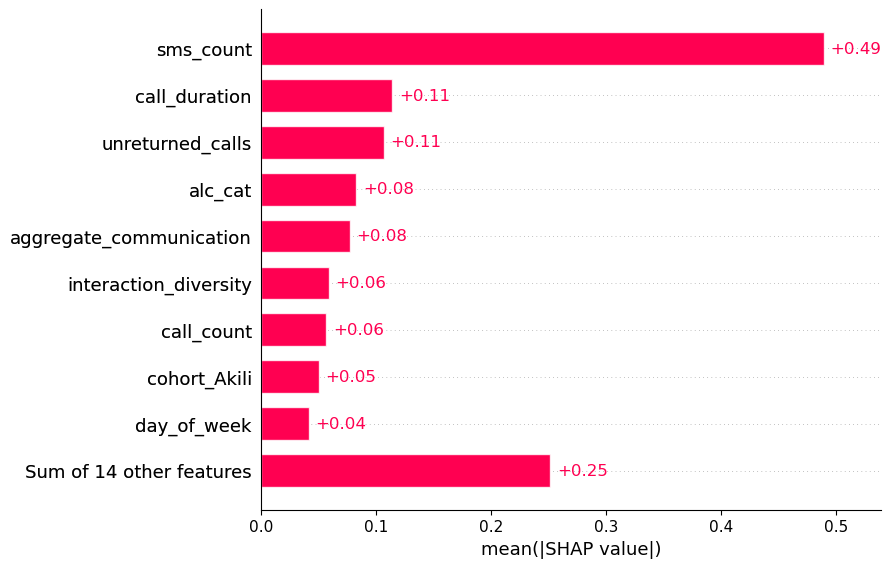

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'gad_cat', 'alc_1', 'alc_2', 'gad7_8', 'gad7_1', 'gad7_6', 'gad7_5', 'sleep_1', 'slee

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/540925546.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



v1_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.086


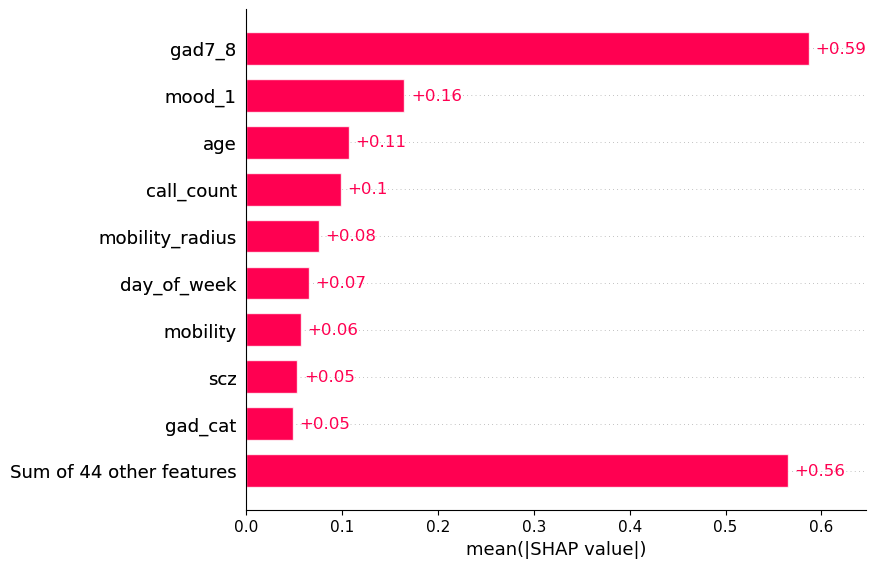

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'gad_cat', 'alc_1', 'alc_2', 'gad7_8', 'gad7_1', 'gad7_6', 'gad7_5', 'sleep_1', 'slee

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/540925546.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



v2_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.035


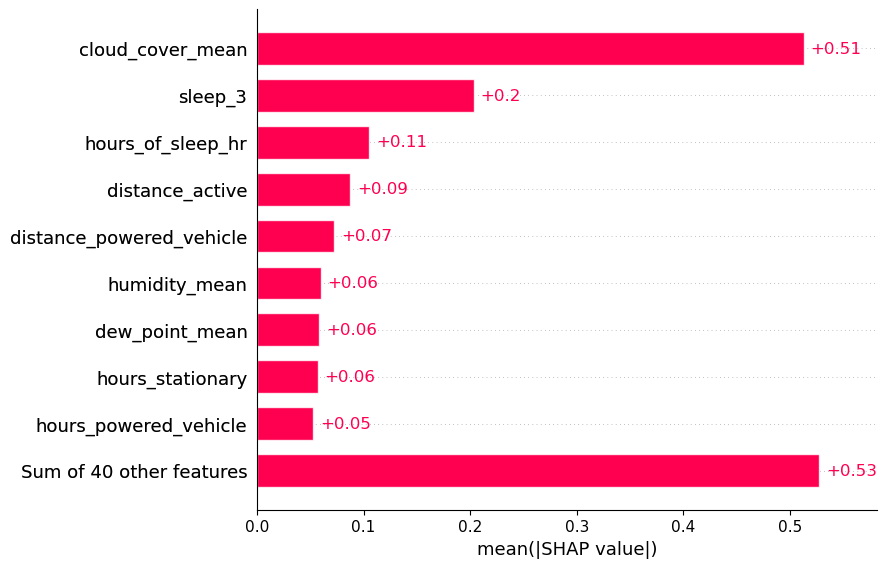

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'gad_cat', 'alc_1', 'alc_2', 'gad7_8', 'gad7_1', 'gad7_6', 'gad7_5', 'sleep_1', 'slee

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/540925546.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/540925546.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



v2_week <class 'type'> HistGradientBoostingRegressor Mean R2: 0.114


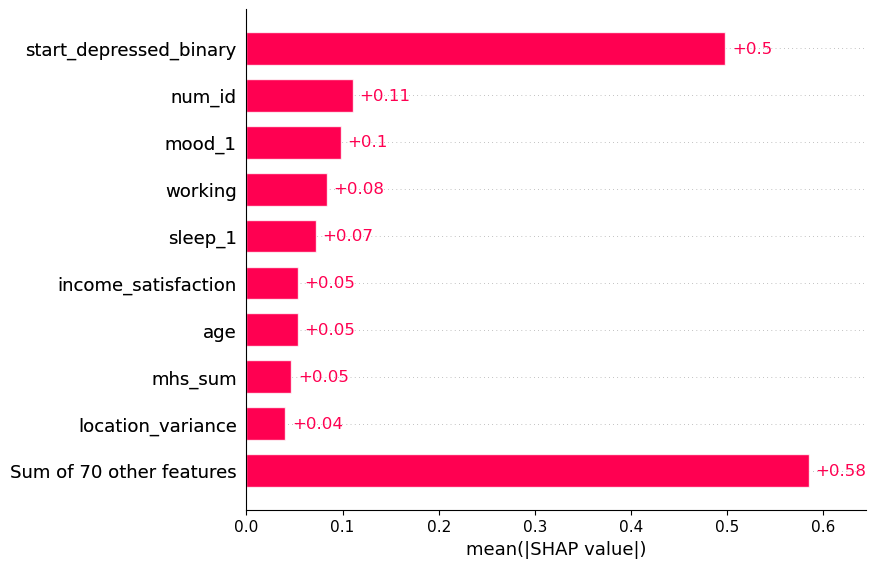

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'gad_cat', 'alc_1', 'alc_2', 'gad7_8', 'gad7_1', 'gad7_6', 'gad7_5', 'sleep_1', 'slee

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/540925546.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/540925546.py:36: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



In [9]:

import gc 

subject_scores = []

for name in ['v1_week','v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				model = model_dict[name][y_col][time][model_name]['model'][i]
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][time][model_name]['X_test_for_model'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i] # use X_test for the plotting bc it has the day/week variable
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)

				print(list(model.feature_names_in_), '\n')

				
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))<3:
						continue

					sub_df = sub_df.sort_values(by='day')

					r2_score_sub = r2_score(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))
					pmc_score_sub = pearsonr(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'Sub {sub}, {X_test.shape[1]} {time} feats, pred. vs. actual {y_col} score | R2:{round(r2_score_sub, 2)}, PMC:{round(pmc_score_sub[0], 2)}')

					fig.show()

					subject_scores.append([name, y_col, time, model_name, sub, r2_score_sub, pmc_score_sub[0]])

subject_scores_df = pd.DataFrame(subject_scores, columns=['name', 'y_col', 'time', 'model_name', 'sub', 'r2_score_sub', 'pmc_score_sub'])
subject_scores_df.to_csv(os.path.join(results_dir, 'subject_phq9_preds_from_diff_models.csv'))

In [ ]:
subject_scores_df = pd.read_csv(os.path.join(results_dir, 'subject_phq9_preds_from_diff_models.csv'))
time_map = {'8wks': 'Passive Variables over 8 weeks', 'both': 'Passive Variables over 8 weeks + Baseline clinical and demographic features'}
for time in time_map.keys():
	for metric in ['r2_score_sub','pmc_score_sub']:
		subject_scores_df=subject_scores_df.mask(subject_scores_df[metric]<-1)
		# assuming your DataFrame is called df
		fig = px.bar(
			subject_scores_df[subject_scores_df['time']==time],
			x='sub',
			y=metric,
			title=f'{metric} Score per Subject',
			labels={'sub': 'Subject ID'},
			color='name'
		)

		# Optional: improve layout and readability
		fig.update_layout(
			xaxis={'type': 'category'},  # keeps x-axis discrete even if numeric
			xaxis_tickangle=-45,
			plot_bgcolor='white',
			yaxis=dict(zeroline=True, zerolinewidth=1, zerolinecolor='black'),
		)
		
		fig.show()

# PHQ2 sum predicting

In [4]:

y_cols = ['phq2_sum']
drop_survey_cols = ['phq2_1','phq2_2','phq2_sum','phq2_bin','sds_1','sds_2','sds_3','stress','support','mhs_1','mhs_2','mhs_3','mhs_4','mhs_5','phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat'] #sum up the MHS vars
end_cols = ['6wks_depressed_binary', 'depression_change_bin']
drop_cols_base = y_cols+drop_survey_cols+end_cols
drop_cols_with_this_present = ['Unnamed','_nan','_indicator','race'] #take out race because it adds 8 vars

time_cols = ['month','week','day']

models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}
model_dict = {}


for name in ['v1_day','v2_day']:
	model_dict[name] = {}
	print(f'\n\n####### {name} #######')
	for y_col in y_cols:
		model_dict[name][y_col] = {}
		Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))
		val_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_test_transformed.csv'))
		Xy['mhs_sum'] = Xy['mhs_1'] + Xy['mhs_2'] + Xy['mhs_3'] + Xy['mhs_4'] + Xy['mhs_5']

		Xy=Xy.dropna(subset=[y_col])
		Xy=Xy.select_dtypes(include=('int64','float64'))
		print(f"Cols in Xy: {Xy.columns.to_list()}")
		y=Xy[y_col]
		baseline_cols_present = matches = [item for item in Xy.columns if any(col in item for col in baseline_cols)]
		drop_cols = drop_cols_base.copy()
		drop_additional_cols = [item for item in Xy.columns if any(col in item for col in drop_cols_with_this_present)]
		drop_cols += drop_additional_cols		

		for time in ['baseline','8wks','both']:
			print(f'\n{time.upper()}')
			model_dict[name][y_col][time] = {}
			if 'baseline' in time:
				X1=Xy[['num_id']+time_cols+baseline_cols_present].copy()
				
			elif '8wks' in time:
				drop_cols = [col for col in drop_cols if col in Xy.columns]
				print(f'Dropping cols: {drop_cols}')
				X1 = Xy.drop(columns=baseline_cols_present+drop_cols).copy()
			else:
				drop_cols = [col for col in drop_cols if col in Xy.columns]
				print(f'Dropping cols: {drop_cols}')
				X1=Xy.drop(columns=drop_cols)
			
			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)
			count=0
			print(f'X has {X1.shape[0]} observations, {X1.shape[1]} features')


			# print('models...')
			for model_name in models:
				model_dict[name][y_col][time][model_name] = {}
				model_dict[name][y_col][time][model_name]['model']=[]
				model_dict[name][y_col][time][model_name]['X_test']=[]
				model_dict[name][y_col][time][model_name]['X_test_for_model']=[]
				model_dict[name][y_col][time][model_name]['r2_scores']=[]
				model_dict[name][y_col][time][model_name]['mae_scores']=[]
				model_dict[name][y_col][time][model_name]['y_pred']=[]
				model_dict[name][y_col][time][model_name]['y_test']=[]
				model_dict[name][y_col][time][model_name]['y_val']=[]
				model_dict[name][y_col][time][model_name]['y_valpred']=[]

				
				for train_idx, test_idx in gkf.split(X1, y, groups):
					X_train, X_test = X1.iloc[train_idx], X1.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
					model_dict[name][y_col][time][model_name]['y_test'].append(y_test)
					model_dict[name][y_col][time][model_name]['X_test'].append(X_test)


					model = models[model_name][0]
					if y_col in ['change_cat','change_binary']:
						model= models[model_name][1]
					
					present_time_cols = [col for col in time_cols if col in X_train.columns]
					X_train_for_model = X_train.drop(columns=present_time_cols)
					if count==0:
						print(f'cols for {X_train_for_model.columns.to_list()}')
						print(f'First CV\n{len(X_train)} observations in X_train, {len(X_test)} in X_test. {X_train['num_id'].nunique()} train subs, {X_test['num_id'].nunique()} test subs')
						print(f'Features in X_train_for_model: {X_train_for_model.columns.to_list()}')
						print(f'Train Subjects ({len(set(list(X_train['num_id'])))}) {set(list(X_train['num_id']))}')
						print(f'Test Subjects ({len(set(list(X_test['num_id'])))}): {set(list(X_test['num_id']))}')
						if len(set(list(X_train['num_id'])+list(X_test['num_id']))) == len(set(list(X_train['num_id']))) + len(set(list(X_test['num_id']))):
							print(f'All subjects in each set are unique')
						else:
							print(f"Overlapping subjects")
						count=1


					model.fit(X_train_for_model, y_train)
					assert list(model.feature_names_in_) == list(X_train_for_model.columns), f"Feature mismatch before saving model for {time}"
					model_dict[name][y_col][time][model_name]['model'].append(model)
					
					X_test_for_model = X_test.drop(columns=[col for col in time_cols if col in X_test.columns])
					model_dict[name][y_col][time][model_name]['X_test_for_model'].append(X_test_for_model)

					y_pred = model.predict(X_test_for_model)

					model_dict[name][y_col][time][model_name]['y_pred'].append(y_pred)

					r2 = r2_score(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"{y_col} from {time} -- mean R²: {round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict[name][y_col][time][model_name]['mae_scores']), 4)} of scores [{round(y.min(), 1)}-{round(y.max(), 1)}]")
				
				# X_val = val_df[[col for col in val_df.columns if col in X_test]]
				# X_val_for_model = val_df[[col for col in X_val.columns if col in X_test_for_model]]
				# X_val_for_model = X_val_for_model[X_test_for_model.columns]
				# yval_pred = model.predict(X_val_for_model)
				# model_dict[name][y_col][time][model_name]['y_valpred'].append(yval_pred)
				# yval_true = val_df[y_col]
				# model_dict[name][y_col][time][model_name]['y_val'].append(yval_true)
				
				# r2 = r2_score(y_test, y_pred)
				# print(f"FOR VAL:: {y_col} from {time} -- R²: {r2}")









####### v1_day #######
Cols in Xy: ['Unnamed: 0.1', 'mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'Unnamed: 0', 'num_id', 'week', 'day', 'day_of_week', 'cohort_Akili', 'cohort_Health tips', 'cohort_PST', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_9030/2968928790.py:20: DtypeWarning: Columns (129) have mixed types. Specify dtype option on import or set low_memory=False.
  Xy=pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_transformed.csv'))


phq2_sum from baseline -- mean R²: 0.044, mean MAE: 0.7771 of scores [-1.3-2.3]

8WKS
Dropping cols: ['phq2_sum', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq2_bin', 'sds_1', 'sds_2', 'sds_3', 'stress', 'support', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', '6wks_depressed_binary', 'depression_change_bin', 'Unnamed: 0.1', 'Unnamed: 0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_6.0', 'race_7.0']
X has 5022 observations, 62 features
cols for ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr'

v1_day <class 'type'> HistGradientBoostingRegressor Mean R2: 0.003


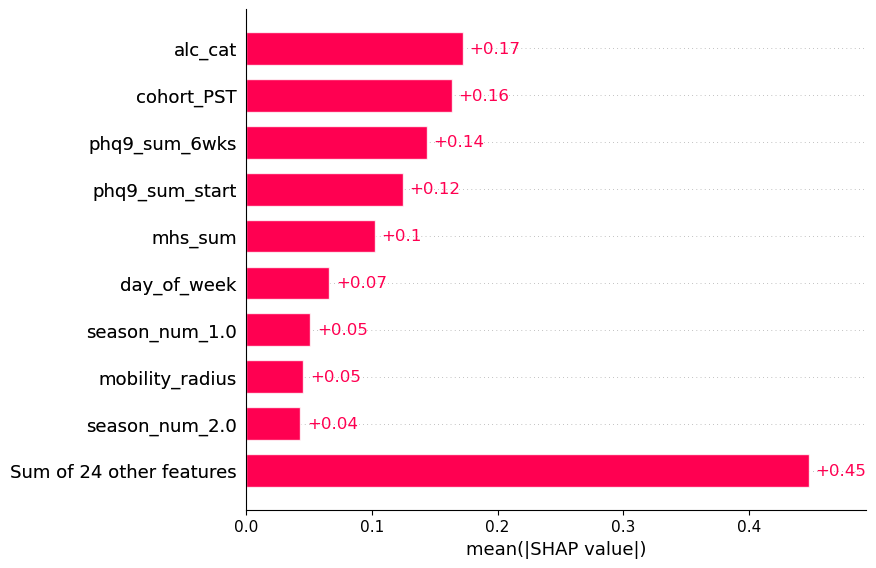

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'ph

v1_day <class 'type'> HistGradientBoostingRegressor Mean R2: 0.078


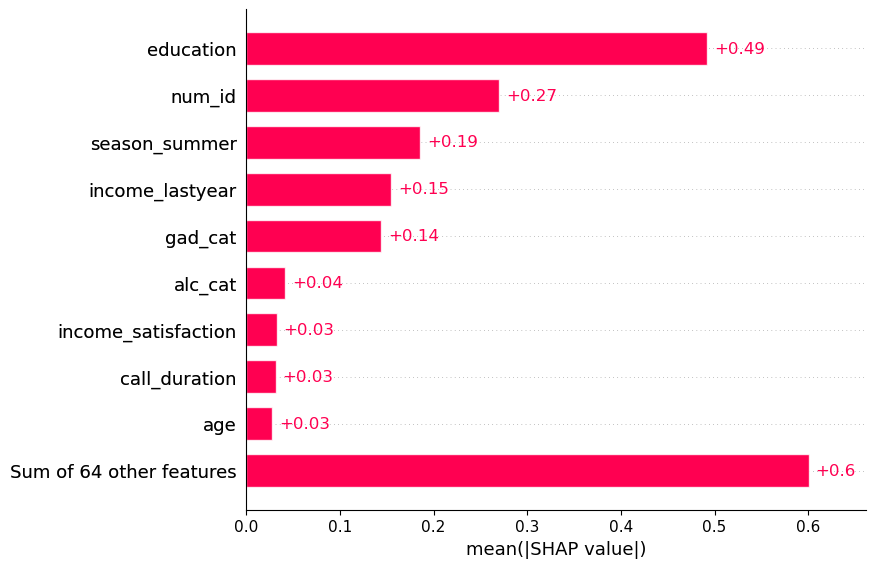

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'ph

v2_day <class 'type'> HistGradientBoostingRegressor Mean R2: 0.024


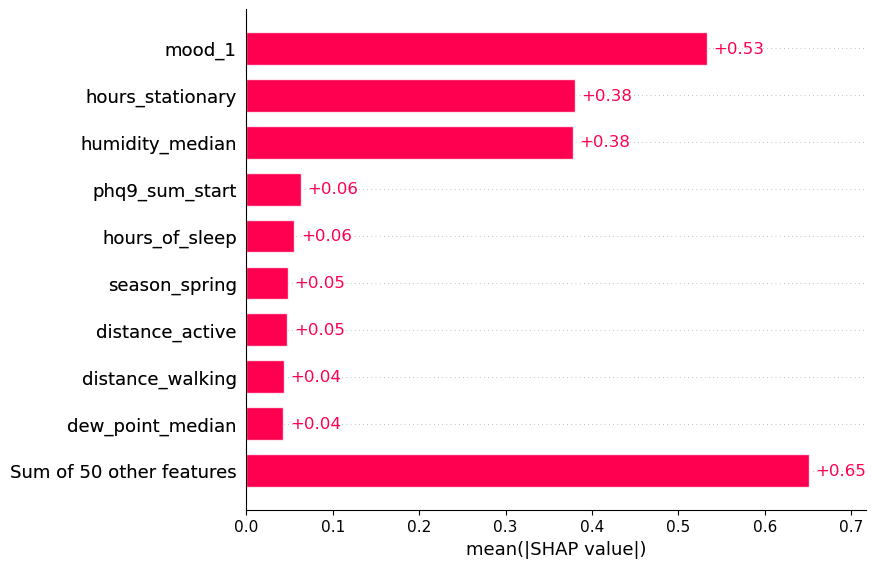

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'ph

v2_day <class 'type'> HistGradientBoostingRegressor Mean R2: 0.029


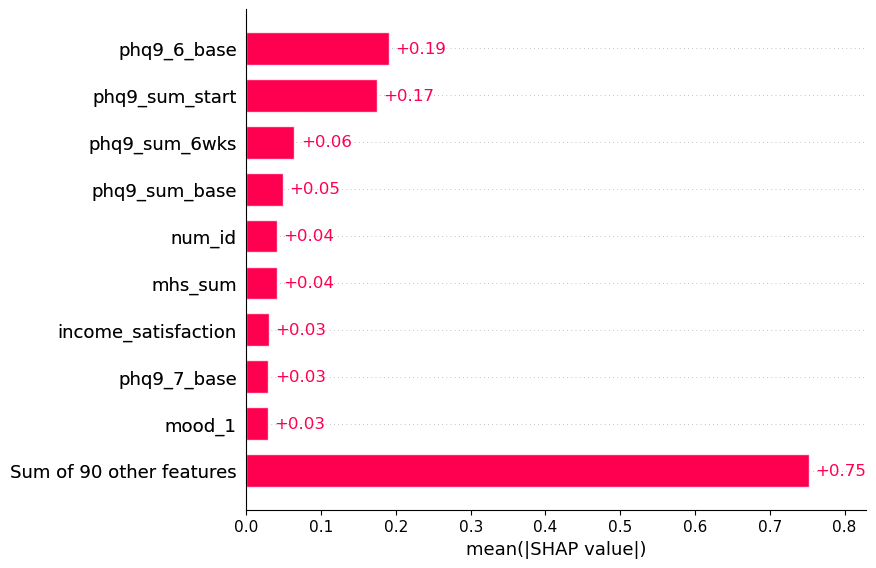

['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'ph

In [ ]:

import gc 

subject_scores = []

for name in ['v1_day','v2_day']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				model = model_dict[name][y_col][time][model_name]['model'][i]
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][time][model_name]['X_test_for_model'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i] # use X_test for the plotting bc it has the day/week variable
				y_pred = model_dict[name][y_col][time][model_name]['y_pred'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_test'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)

				print(list(model.feature_names_in_), '\n')

				
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))<3:
						continue

					sub_df = sub_df.sort_values(by='day')

					r2_score_sub = r2_score(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))
					pmc_score_sub = pearsonr(list(sub_df[f'{y_col}_actual']), list(sub_df[f'{y_col}_pred']))

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'Sub {sub}, {X_test.shape[1]} {time} feats, pred. vs. actual {y_col} score | R2:{round(r2_score_sub, 2)}, PMC:{round(pmc_score_sub[0], 2)}')29					fig.show()

					subject_scores.append([name, y_col, time, model_name, sub, r2_score_sub, pmc_score_sub[0]])

subject_scores_df = pd.DataFrame(subject_scores, columns=['name', 'y_col', 'time', 'model_name', 'sub', 'r2_score_sub', 'pmc_score_sub'])
subject_scores_df.to_csv(os.path.join(results_dir, 'subject_phq2_preds_from_diff_models.csv'))

# Subject Scores for PHQ2 prediction

In [48]:
subject_scores_df = pd.read_csv(os.path.join(results_dir, 'subject_phq2_preds_from_diff_models.csv'))
time_map = {'8wks': 'Passive Variables over 8 weeks', 'both': 'Passive Variables over 8 weeks + Baseline clinical and demographic features'}
for time in time_map.keys():
	for metric in ['r2_score_sub','pmc_score_sub']:
		subject_scores_df=subject_scores_df.mask(subject_scores_df[metric]<-1)
		# assuming your DataFrame is called df
		fig = px.bar(
			subject_scores_df[subject_scores_df['time']==time],
			x='sub',
			y=metric,
			title=f'{metric} Score per Subject',
			labels={'sub': 'Subject ID'},
			color='name'
		)

		# Optional: improve layout and readability
		fig.update_layout(
			xaxis={'type': 'category'},  # keeps x-axis discrete even if numeric
			xaxis_tickangle=-45,
			plot_bgcolor='white',
			yaxis=dict(zeroline=True, zerolinewidth=1, zerolinecolor='black'),
		)
		
		fig.show()

# SHAP Printing and by-subject model predictions for held-out val set - graphs of predicted vs. true

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.426


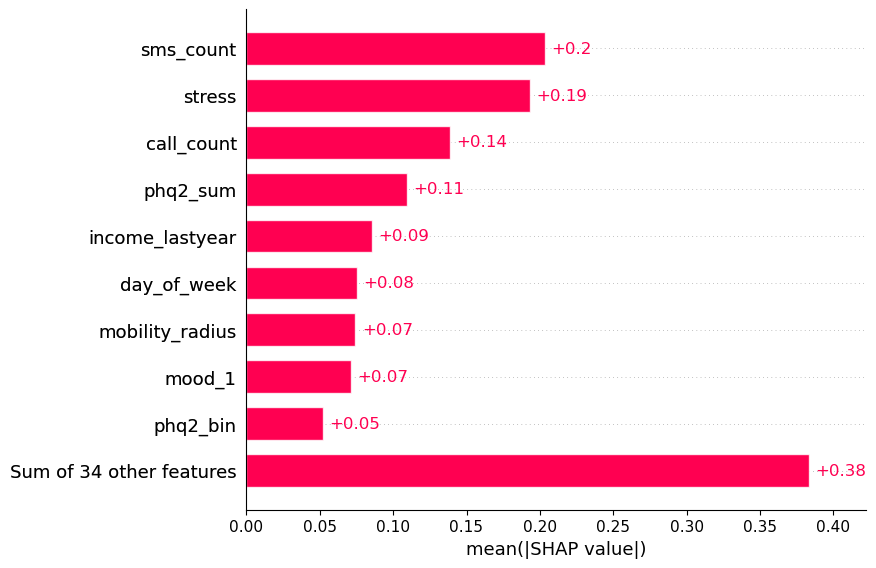

v1_week 8wks HistGradientBoostingRegressor Mean R2: 0.405


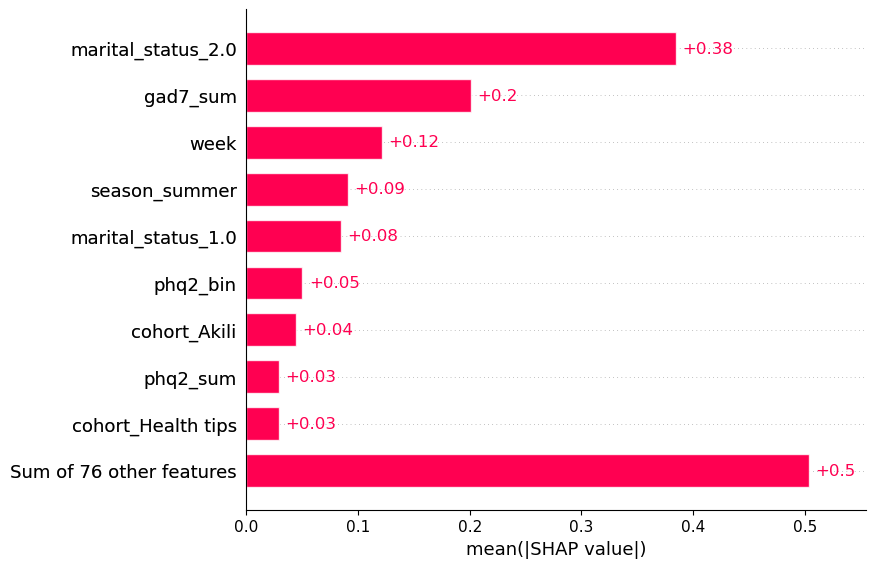

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.345


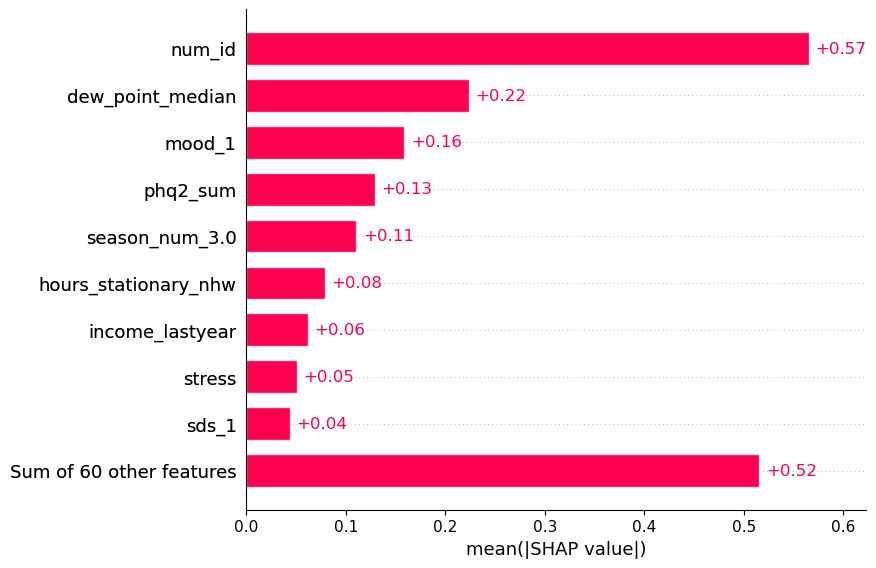

v2_week 8wks HistGradientBoostingRegressor Mean R2: 0.341


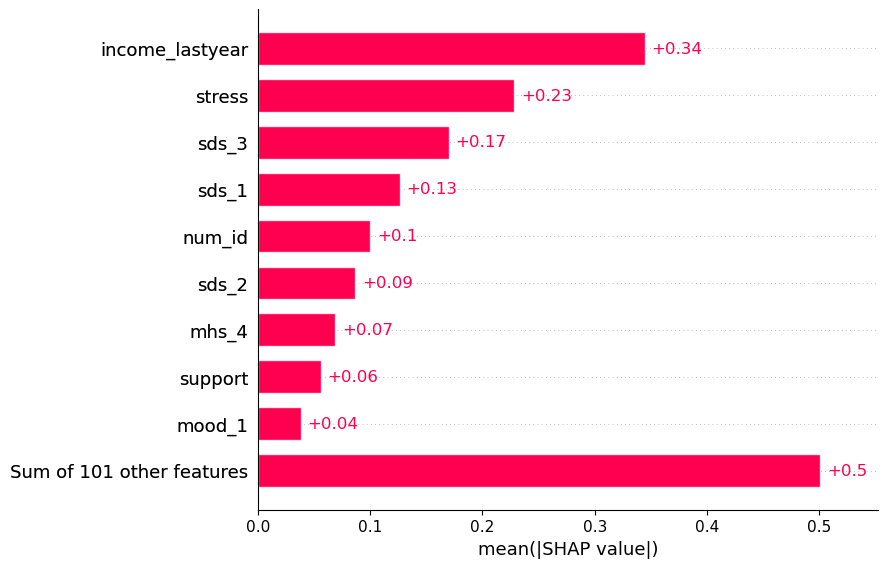

In [ ]:
import gc 

for name in ['v1_week', 'v2_week']: #4
	for y_col in ['phq9_sum']: #2
		for time in ['8wks','both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][time][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				explainer = shap.Explainer(model_dict[name][y_col][time][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][time][model_name]['X_test'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  

				X_test = model_dict[name][y_col][time][model_name]['X_test'][i]
				y_pred = model_dict[name][y_col][time][model_name]['y_val'][i]
				y_test = model_dict[name][y_col][time][model_name]['y_valpred'][i]

				y_df = pd.DataFrame({f'{y_col}_pred': y_pred, f'{y_col}_actual': y_test})
				df = pd.concat([X_test, y_df], axis=1)
				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df.dropna(subset=f'{y_col}_pred'))==0:
						continue
					sub_df = sub_df.sort_values(by='day')

					fig = px.line(sub_df, x='day', y=[f'{y_col}_pred', f'{y_col}_actual'], 
					title=f'For sub {sub}, using {X_test.shape[1]} {time} features,  pred. vs. actual {y_col} score -- Mean R2 = {mean_r2} over 5 CVs')

					fig.show()





			

['gad7_1', 'gad7_2', 'gad7_3', 'gad7_4', 'gad7_5', 'gad7_6', 'gad7_7', 'gad7_8', 'gad7_sum', 'gad_cat', 'phq9_1_base', 'phq9_2_base', 'phq9_3_base', 'phq9_4_base', 'phq9_5_base', 'phq9_6_base', 'phq9_7_base', 'phq9_8_base', 'phq9_9_base', 'phq9_sum_base', 'cid', 'bin_clin', 'bipolar', 'scz', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'gender', 'education', 'working', 'income_satisfaction', 'incomelastyear', 'marital_status', 'race', 'age', 'heard_about_us', 'device', 'startdate', 'study_arm', 'study', 'alc_1', 'alc_2', 'alc_3', 'alc_sum', 'alc_cat', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5']


# Modelling using slope, int and mean features with ONLY first 4 weeks


In [ ]:

from sklearn.ensemble import HistGradientBoostingRegressor
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import f_classif, SelectKBest
fs = SelectKBest(score_func=f_classif, k=25)

print('Using smartphone sensor data + surveys, over 8 weeks')

y_cols =['phq9_sum_6wks', '6wks_depressed_binary', 'depression_change_bin']
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}

model_dict_slopeint = {}
count=0
for name in ['v1_day', 'v2_day']: 
	Xy = pd.read_csv(os.path.join(brighten_dir, f"{name}_wide_slopeintercept_2wk_outcomes.csv"))
	model_dict_slopeint[name] = {}
	

	print(f'####### {name} #######')
	for y_col in y_cols:
		Xy = Xy.dropna(subset=[y_col])

		model_dict_slopeint[name][y_col] = {}
		for time in ['8wks','both','baseline']:
			print(f'\n\nPREDICTING: {y_col} from {time}')
			if 'baseline' in time:
				usable_cols = baseline_cols
			if '8wks' in time:
				usable_cols = daily_cols_v1+daily_cols_v2+weekly_cols
			elif 'both' in time:
				usable_cols = baseline_cols+daily_cols_v1+daily_cols_v2+weekly_cols

			model_dict_slopeint[name][y_col][time]={}
			
			y=Xy[y_col]
			# columns to drop
			X=Xy[[col for col in Xy.columns if any(item in col for item in usable_cols) and 'phq' not in col]].copy()
			X=X.drop(columns=[col for col in X.columns if 'block3' in col or 'block4' in col or 'block5' in col or 'block6' in col]).copy()	
	
			print(f'X has {X.shape[0]} observations, {X.shape[1]} features')
			
			#display(X)
			non_numeric_cols = X.select_dtypes(include=['object']).columns
			if len(non_numeric_cols) > 0:
				print("Non-numeric columns found:", non_numeric_cols)
				print(X[non_numeric_cols].head())
			
			# Inputs
			groups = Xy['num_id']
			gkf = GroupKFold(n_splits=5)


			for model_name in models:
				model_dict_slopeint[name][y_col][time][model_name] = {}
				model_dict_slopeint[name][y_col][time][model_name]['model']=[]
				model_dict_slopeint[name][y_col][time][model_name]['X_test']=[]
				model_dict_slopeint[name][y_col][time][model_name]['r2_scores']=[]
				model_dict_slopeint[name][y_col][time][model_name]['mae_scores']=[]
				for train_idx, test_idx in gkf.split(X, y, groups):
					X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

					if X_train.shape[0]==0 or X_train.shape[1]==0 or len(X_train)==0:
						model_dict_slopeint[name][y_col][time][model_name]['model'].append(np.nan)
						model_dict_slopeint[name][y_col][time][model_name]['X_test'].append(np.nan)
						model_dict_slopeint[name][y_col][time][model_name]['r2_scores'].append(np.nan)
						model_dict_slopeint[name][y_col][time][model_name]['mae_scores'].append(np.nan)
						continue

					model = models[model_name][0]
					if y_col in ['start_depressed_binary','6wks_depressed_binary','depression_change_bin','bin_clin']:
						model= models[model_name][1]

					model.fit(X_train, y_train)
					model_dict_slopeint[name][y_col][time][model_name]['model'].append(model)

					y_pred = np.round(model.predict(X_test)).astype(int) #ordinal Y
					model_dict_slopeint[name][y_col][time][model_name]['X_test'].append(X_test)

					r2 = r2_score(y_test, y_pred)
					model_dict_slopeint[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict_slopeint[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"TIME {time} -- mean R²: {round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['mae_scores']), 4)} of {round(y.min(), 1)}-{round(y.max(), 1)}\n")




Using smartphone sensor data + surveys, over 8 weeks
####### v1_day #######


PREDICTING: phq9_sum_6wks from 8wks
X has 301 observations, 152 features
TIME 8wks -- mean R²: -0.2835, mean MAE: 4.7697 of 0.0-25.0



PREDICTING: phq9_sum_6wks from both
X has 301 observations, 185 features
TIME both -- mean R²: -0.3146, mean MAE: 4.8123 of 0.0-25.0



PREDICTING: phq9_sum_6wks from baseline
X has 301 observations, 33 features
TIME baseline -- mean R²: -0.5071, mean MAE: 5.1059 of 0.0-25.0



PREDICTING: 6wks_depressed_binary from 8wks
X has 301 observations, 152 features
TIME 8wks -- mean R²: -1.0574, mean MAE: 0.289 of 0.0-1.0



PREDICTING: 6wks_depressed_binary from both
X has 301 observations, 185 features
TIME both -- mean R²: -0.8338, mean MAE: 0.2656 of 0.0-1.0



PREDICTING: 6wks_depressed_binary from baseline
X has 301 observations, 33 features
TIME baseline -- mean R²: -0.853, mean MAE: 0.2757 of 0.0-1.0



PREDICTING: depression_change_bin from 8wks
X has 301 observations, 152 f

# Now show the feature importance for the above


name v1_day y_col phq9_sum_start time 8wks model_name HistGradientBoostingRegressor mean r2 -0.4574


,columns,shap_values
2,missed_interactions_block1_slope,2.272569
6,missed_interactions_block1_mean,1.169063
0,call_count_block1_intercept,1.021648
7,sms_count_block1_slope,0.758957
10,unreturned_calls_block1_mean,0.758506
5,call_count_block1_std,0.697093
14,aggregate_communication_block1_intercept,0.664966
1,missed_interactions_block1_std,0.413074
3,call_count_block1_mean,0.315301
11,interaction_diversity_block1_slope,0.268813


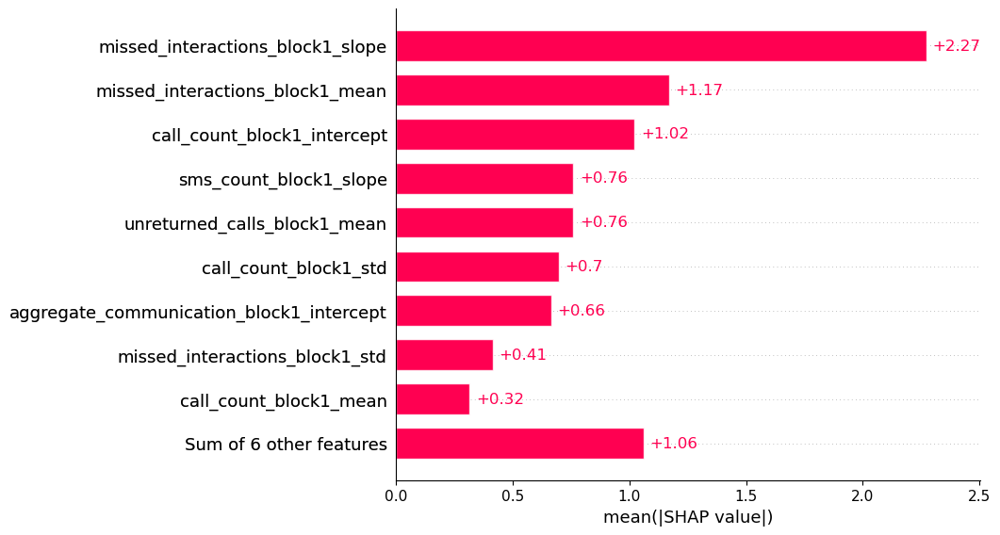

name v1_day y_col phq9_sum_start time both model_name HistGradientBoostingRegressor mean r2 -0.4574


,columns,shap_values
2,missed_interactions_block1_slope,2.272569
6,missed_interactions_block1_mean,1.169063
0,call_count_block1_intercept,1.021648
7,sms_count_block1_slope,0.758957
10,unreturned_calls_block1_mean,0.758506
5,call_count_block1_std,0.697093
14,aggregate_communication_block1_intercept,0.664966
1,missed_interactions_block1_std,0.413074
3,call_count_block1_mean,0.315301
11,interaction_diversity_block1_slope,0.268813


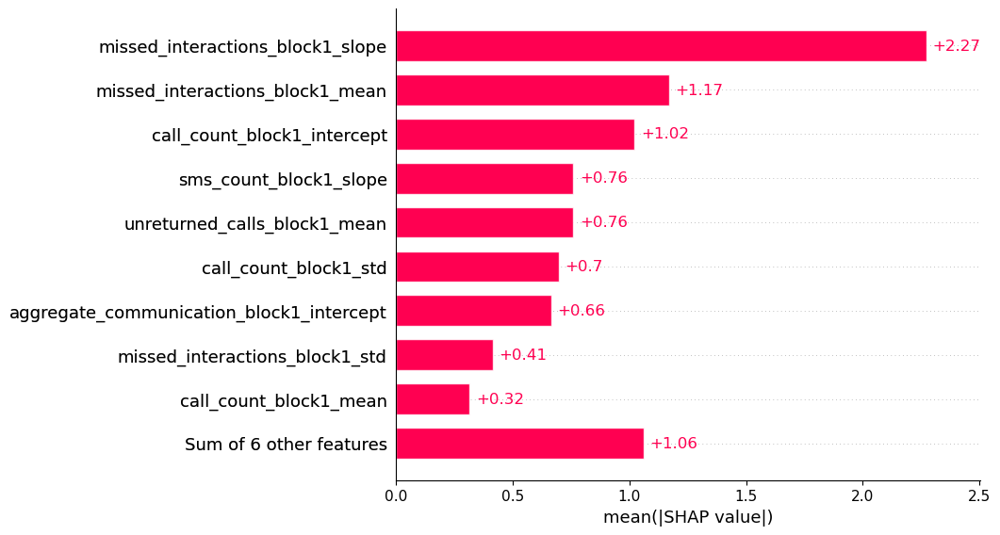

name v1_day y_col phq9_sum_start time baseline model_name HistGradientBoostingRegressor mean r2 -0.3329


,columns,shap_values
0,gad7_7,2.172646
6,bin_clin,1.155311
5,mhs_4,0.976262
7,race,0.930481
1,education,0.726734
2,gad7_sum,0.514536
10,alc_2,0.475620
14,gad7_2,0.459865
9,marital_status,0.447701
3,age,0.400951


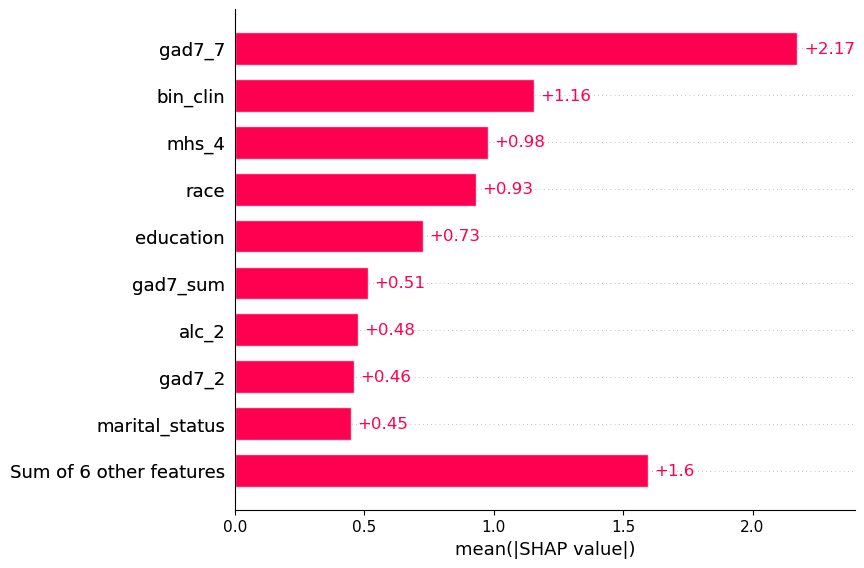

name v1_day y_col start_depressed_binary time 8wks model_name HistGradientBoostingRegressor mean r2 -0.3205
['mobility_block1_slope', 'mobility_block1_intercept', 'mobility_block1_mean', 'mobility_block1_std', 'mobility_radius_block1_slope', 'mobility_radius_block1_intercept', 'mobility_radius_block1_mean', 'mobility_radius_block1_std', 'unreturned_calls_block1_slope', 'unreturned_calls_block1_intercept', 'unreturned_calls_block1_mean', 'unreturned_calls_block1_std', 'call_duration_block1_slope', 'call_duration_block1_intercept', 'call_duration_block1_mean', 'call_duration_block1_std', 'call_count_block1_slope', 'call_count_block1_intercept', 'call_count_block1_mean', 'call_count_block1_std', 'aggregate_communication_block1_slope', 'aggregate_communication_block1_intercept', 'aggregate_communication_block1_mean', 'aggregate_communication_block1_std', 'interaction_diversity_block1_slope', 'interaction_diversity_block1_intercept', 'interaction_diversity_block1_mean', 'interaction_diversi

,columns,shap_values
2,missed_interactions_block1_slope,2.272569
6,missed_interactions_block1_mean,1.169063
0,call_count_block1_intercept,1.021648
7,sms_count_block1_slope,0.758957
10,unreturned_calls_block1_mean,0.758506
5,call_count_block1_std,0.697093
14,aggregate_communication_block1_intercept,0.664966
1,missed_interactions_block1_std,0.413074
3,call_count_block1_mean,0.315301
11,interaction_diversity_block1_slope,0.268813


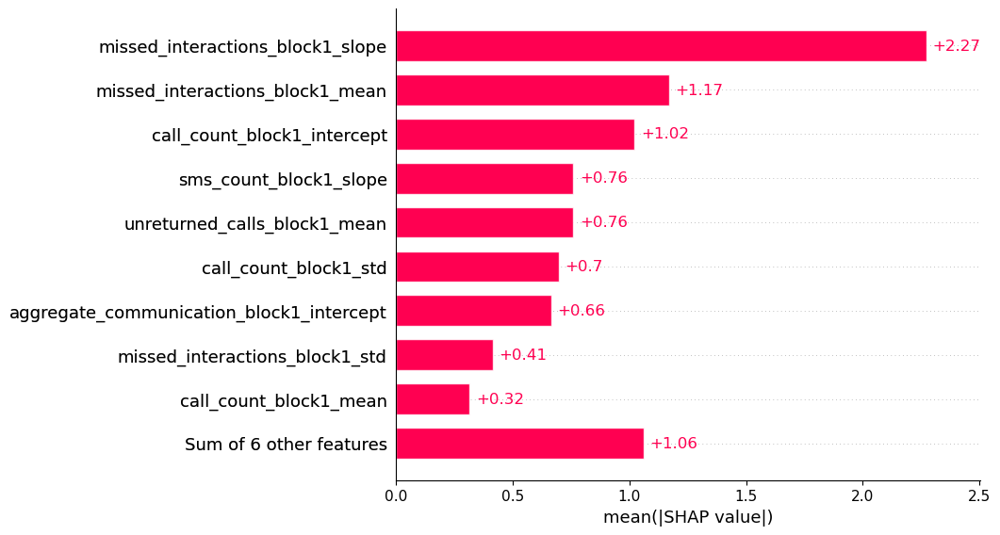

name v1_day y_col phq9_sum_6wks time both model_name HistGradientBoostingRegressor mean r2 -0.4491


,columns,shap_values
2,missed_interactions_block1_slope,2.272569
6,missed_interactions_block1_mean,1.169063
0,call_count_block1_intercept,1.021648
7,sms_count_block1_slope,0.758957
10,unreturned_calls_block1_mean,0.758506
5,call_count_block1_std,0.697093
14,aggregate_communication_block1_intercept,0.664966
1,missed_interactions_block1_std,0.413074
3,call_count_block1_mean,0.315301
11,interaction_diversity_block1_slope,0.268813


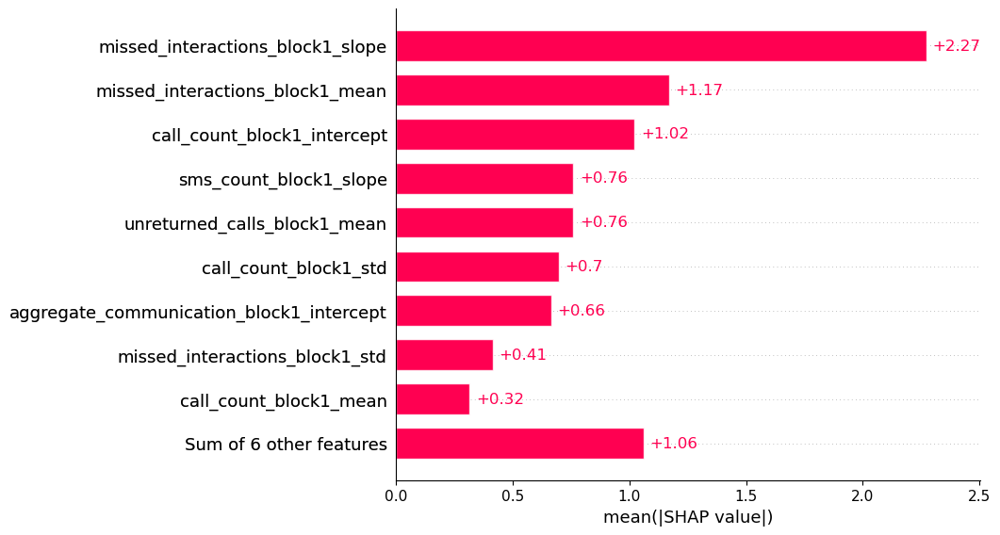

name v1_day y_col phq9_sum_6wks time baseline model_name HistGradientBoostingRegressor mean r2 -0.4168


,columns,shap_values
0,gad7_7,2.172646
6,bin_clin,1.155311
5,mhs_4,0.976262
7,race,0.930481
1,education,0.726734
2,gad7_sum,0.514536
10,alc_2,0.475620
14,gad7_2,0.459865
9,marital_status,0.447701
3,age,0.400951


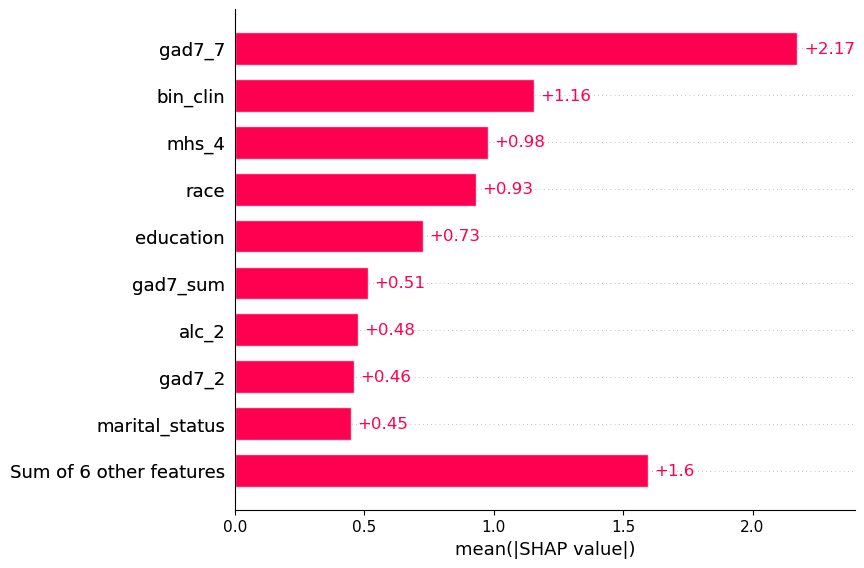

name v1_day y_col 6wks_depressed_binary time 8wks model_name HistGradientBoostingRegressor mean r2 -1.0574
name v1_day y_col 6wks_depressed_binary time both model_name HistGradientBoostingRegressor mean r2 -0.8338
name v1_day y_col 6wks_depressed_binary time baseline model_name HistGradientBoostingRegressor mean r2 -0.853
name v1_day y_col depression_change_bin time 8wks model_name HistGradientBoostingRegressor mean r2 -0.1527
name v1_day y_col depression_change_bin time both model_name HistGradientBoostingRegressor mean r2 -0.1275
name v1_day y_col depression_change_bin time baseline model_name HistGradientBoostingRegressor mean r2 -0.8715
name v2_day y_col phq9_sum_start time 8wks model_name HistGradientBoostingRegressor mean r2 -0.3089


,columns,shap_values
0,hours_of_sleep_hr_block1_intercept,1.507048
2,location_variance_hr_block1_std,1.243792
6,location_variance_hr_block1_mean,1.207051
5,location_variance_hr_block1_slope,1.030984
7,precip_sum_block1_slope,0.870542
10,distance_walking_hr_block1_slope,0.683593
1,distance_walking_hr_block1_std,0.675807
14,cloud_cover_IQR_block1_intercept,0.675276
3,hours_of_sleep_hr_block1_mean,0.352077
11,hours_powered_vehicle_hr_block1_slope,0.291468


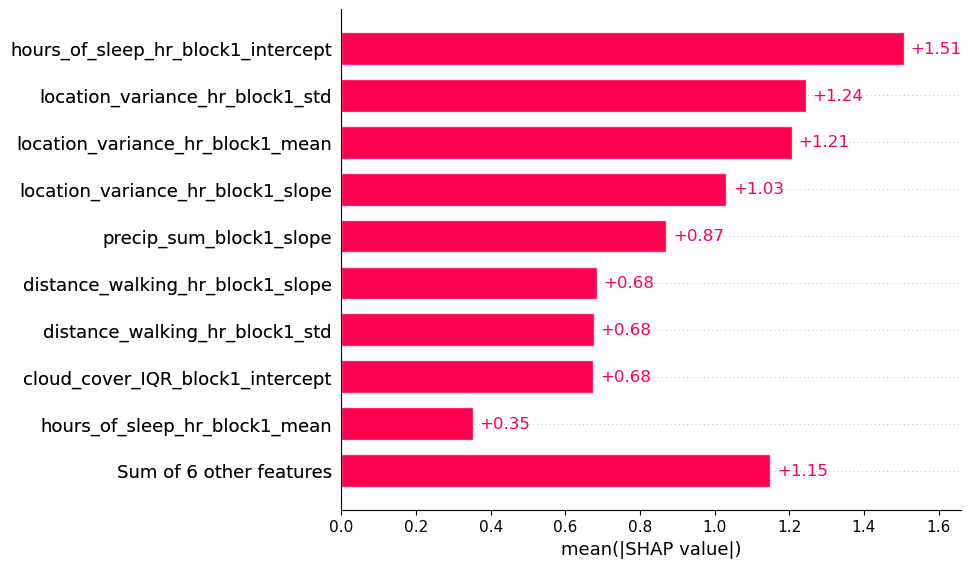

name v2_day y_col phq9_sum_start time both model_name HistGradientBoostingRegressor mean r2 -0.3089


,columns,shap_values
0,hours_of_sleep_hr_block1_intercept,1.507048
2,location_variance_hr_block1_std,1.243792
6,location_variance_hr_block1_mean,1.207051
5,location_variance_hr_block1_slope,1.030984
7,precip_sum_block1_slope,0.870542
10,distance_walking_hr_block1_slope,0.683593
1,distance_walking_hr_block1_std,0.675807
14,cloud_cover_IQR_block1_intercept,0.675276
3,hours_of_sleep_hr_block1_mean,0.352077
11,hours_powered_vehicle_hr_block1_slope,0.291468


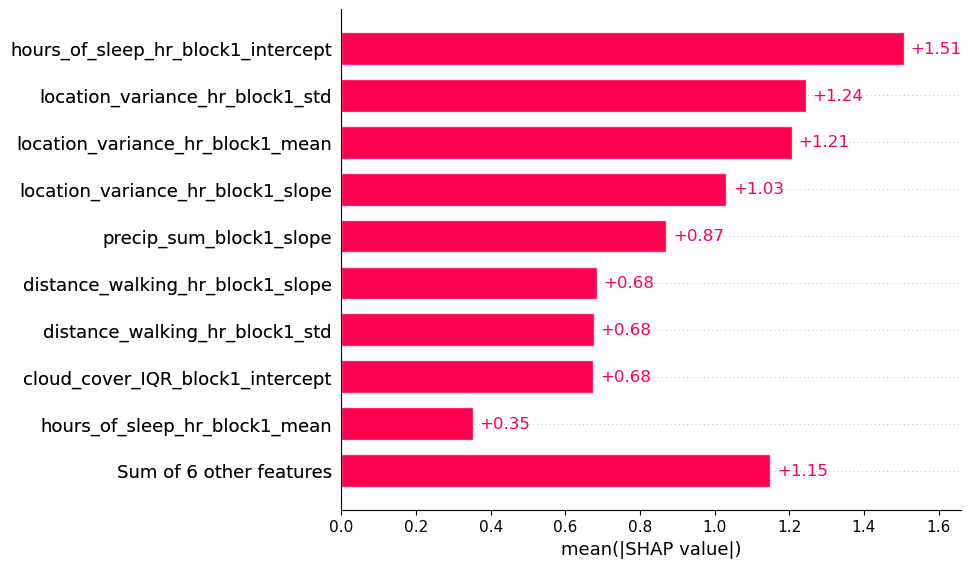

name v2_day y_col phq9_sum_start time baseline model_name HistGradientBoostingRegressor mean r2 -0.1921


,columns,shap_values
0,education,1.091689
1,bin_clin,0.994969
2,gad7_7,0.878529
4,age,0.877986
3,mhs_4,0.683291
5,marital_status,0.457912
6,race,0.446458
7,gad7_sum,0.414015
9,gender,0.386880
10,working,0.347928


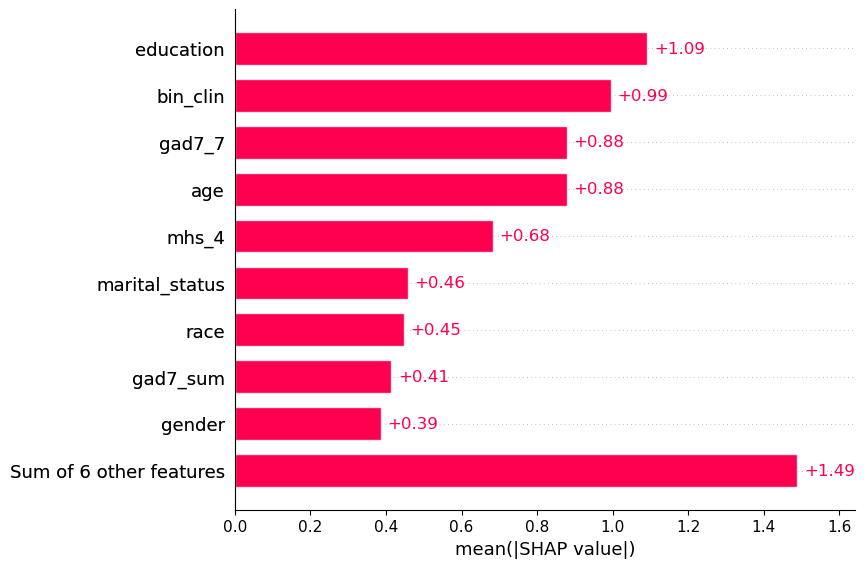

name v2_day y_col start_depressed_binary time 8wks model_name HistGradientBoostingRegressor mean r2 -0.7562
name v2_day y_col start_depressed_binary time both model_name HistGradientBoostingRegressor mean r2 -0.6739
name v2_day y_col start_depressed_binary time baseline model_name HistGradientBoostingRegressor mean r2 -0.8025
name v2_day y_col phq9_sum_6wks time 8wks model_name HistGradientBoostingRegressor mean r2 -0.5248


,columns,shap_values
0,hours_of_sleep_hr_block1_intercept,1.507048
2,location_variance_hr_block1_std,1.243792
6,location_variance_hr_block1_mean,1.207051
5,location_variance_hr_block1_slope,1.030984
7,precip_sum_block1_slope,0.870542
10,distance_walking_hr_block1_slope,0.683593
1,distance_walking_hr_block1_std,0.675807
14,cloud_cover_IQR_block1_intercept,0.675276
3,hours_of_sleep_hr_block1_mean,0.352077
11,hours_powered_vehicle_hr_block1_slope,0.291468


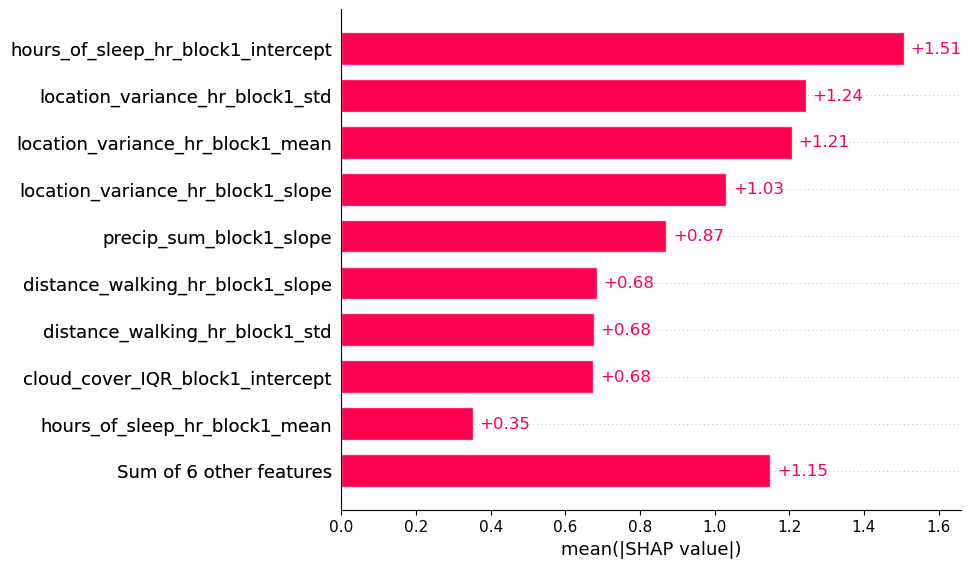

name v2_day y_col phq9_sum_6wks time both model_name HistGradientBoostingRegressor mean r2 -0.5248


,columns,shap_values
0,hours_of_sleep_hr_block1_intercept,1.507048
2,location_variance_hr_block1_std,1.243792
6,location_variance_hr_block1_mean,1.207051
5,location_variance_hr_block1_slope,1.030984
7,precip_sum_block1_slope,0.870542
10,distance_walking_hr_block1_slope,0.683593
1,distance_walking_hr_block1_std,0.675807
14,cloud_cover_IQR_block1_intercept,0.675276
3,hours_of_sleep_hr_block1_mean,0.352077
11,hours_powered_vehicle_hr_block1_slope,0.291468


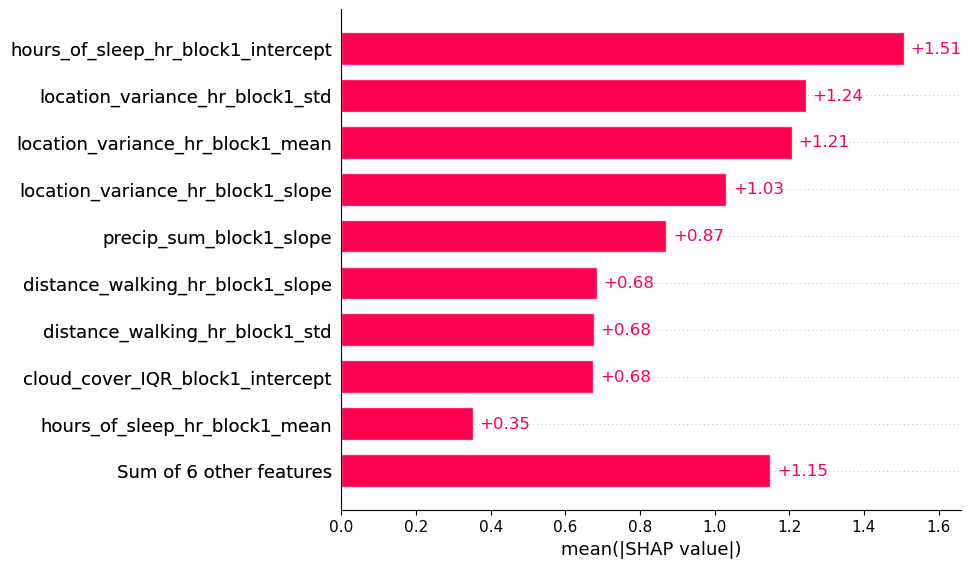

name v2_day y_col phq9_sum_6wks time baseline model_name HistGradientBoostingRegressor mean r2 -0.3146


,columns,shap_values
0,education,1.091689
1,bin_clin,0.994969
2,gad7_7,0.878529
4,age,0.877986
3,mhs_4,0.683291
5,marital_status,0.457912
6,race,0.446458
7,gad7_sum,0.414015
9,gender,0.386880
10,working,0.347928


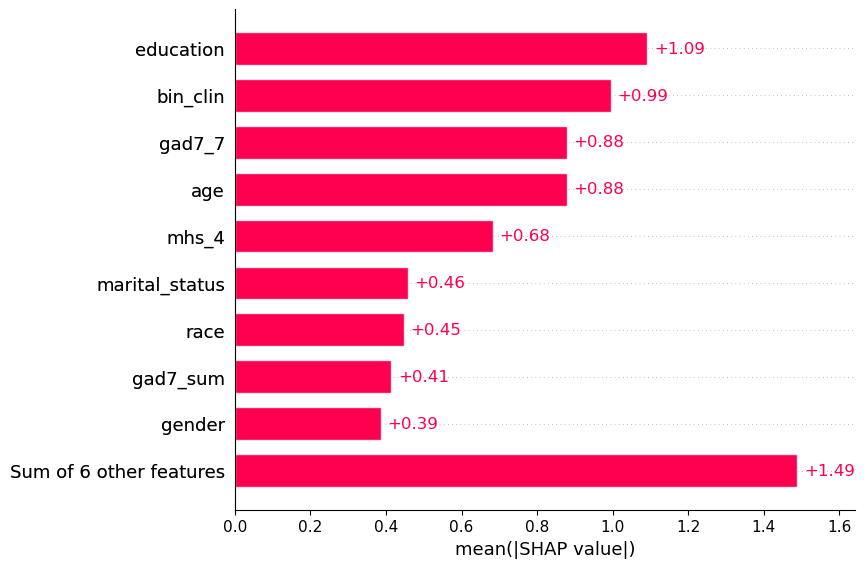

name v2_day y_col 6wks_depressed_binary time 8wks model_name HistGradientBoostingRegressor mean r2 -1.3233
name v2_day y_col 6wks_depressed_binary time both model_name HistGradientBoostingRegressor mean r2 -1.216
name v2_day y_col 6wks_depressed_binary time baseline model_name HistGradientBoostingRegressor mean r2 -1.1539
name v2_day y_col depression_change_bin time 8wks model_name HistGradientBoostingRegressor mean r2 -0.4489
name v2_day y_col depression_change_bin time both model_name HistGradientBoostingRegressor mean r2 -0.5416
name v2_day y_col depression_change_bin time baseline model_name HistGradientBoostingRegressor mean r2 -0.8012


In [ ]:
i=0 #change based on which CV you want to see
count=0
top15features = {}
for name, y_dict in model_dict_slopeint.items():
	top15features[name] = {}
	for y_col, type_dict in y_dict.items():
		top15features[name][y_col] = {}
		for time, model_dict in type_dict.items():
			for model_name, metrics in model_dict.items():
				# mean_r2 = round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['r2_scores']), 3)
				print('name',name, 'y_col',y_col, 'time',time, 'model_name',model_name, 'mean r2', round(np.mean(model_dict_slopeint[name][y_col][time][model_name]['r2_scores']), 4))
		
				model = model_dict_slopeint[name][y_col][time][model_name]['model'][i]
				X_test = model_dict_slopeint[name][y_col][time][model_name]['X_test'][i]
				
				if name == 'v1_day' and y_col == 'start_depressed_binary' and time == '8wks':
					if count<1:
						print(X_test.columns.to_list())
						count=1

				if model is None or X_test is None or len(X_test) == 0:
					continue

				# === Choose the right SHAP explainer dynamically ===
				if y_col in ['start_depressed_binary','6wks_depressed_binary','depression_change_bin']:
					continue
					# fallback to model-agnostic Explainer for Classifier
					explainer = shap.Explainer(model.predict_proba, X_test, feature_names=X_test.columns)
					shap_values = explainer(X_test)

					# SHAP gives one explanation per class → pick positive class (index 1)
					shap_values = shap_values[:, :, 1]
				else:
					# normal tree explainer for Regressor
					explainer = shap.TreeExplainer(model, approximate=True)
					shap_values = explainer(X_test, check_additivity=False)

				# === Plot mean absolute SHAP values per feature ===
				shap_df = pd.DataFrame({
					'columns': X_test.columns,
					'shap_values': np.abs(shap_values.values).mean(axis=0)
				})
				display(shap_df.sort_values('shap_values', ascending=False).head(10))

				shap.plots.bar(shap_values, max_display=10)

				del explainer, shap_values
				gc.collect()

				shap_df = shap_df.sort_values(by='shap_values', ascending=False) #sort from highest to lowest
				top15features[name][y_col][time] = list(shap_df['columns'])[:20]
				

# Using only the top 10 features from feature importance 
### Still slope/int and block1+2 to predict week 6

In [ ]:


model_dict_slopeint_top10 = {}
y_cols =['phq9_sum_start', 'phq9_sum_6wks']

models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}

for name in ['v1_day','v2_day']: 
	df = pd.read_csv(os.path.join(brighten_dir, f"{name}_wide_slopeintercept_2wk_outcomes.csv"))
	model_dict_slopeint_top10[name] = {}
	

	print(f'####### {name} #######')
	for y_col in ['phq9_sum_start', 'phq9_sum_6wks']:

		df_clean = df.dropna(subset=[y_col])
		model_dict_slopeint_top10[name][y_col] = {}
		for time in ['8wks','both','baseline']:
			model_dict_slopeint_top10[name][y_col][time]={}
			y=df_clean[y_col]
			X=df_clean[top15features[name][y_col][time]]
			#display(X)
			non_numeric_cols = X.select_dtypes(include=['object']).columns
			if len(non_numeric_cols) > 0:
				print("Non-numeric columns found:", non_numeric_cols)
				print(X[non_numeric_cols].head())

				
			# Inputs
			groups = df_clean['num_id']
			gkf = GroupKFold(n_splits=5)

			for model_name in models:
				model_dict_slopeint_top10[name][y_col][time][model_name] = {}
				model_dict_slopeint_top10[name][y_col][time][model_name]['model']=[]
				model_dict_slopeint_top10[name][y_col][time][model_name]['X_test']=[]
				model_dict_slopeint_top10[name][y_col][time][model_name]['r2_scores']=[]
				model_dict_slopeint_top10[name][y_col][time][model_name]['mae_scores']=[]
				for train_idx, test_idx in gkf.split(X, y, groups):
					X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
					y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

					if X_train.shape[0]==0 or X_train.shape[1]==0 or len(X_train)==0:
						continue

					model = models[model_name][0]
					if y_col in ['start_depressed_binary','6wks_depressed_binary','depression_change_bin','bin_clin']:
						model= models[model_name][1]
					model.fit(X_train, y_train)
					model_dict_slopeint_top10[name][y_col][time][model_name]['model'].append(model)

					y_pred = np.round(model.predict(X_test)).astype(int) #ordinal Y
					model_dict_slopeint_top10[name][y_col][time][model_name]['X_test'].append(X_test)

					r2 = r2_score(y_test, y_pred)
					model_dict_slopeint_top10[name][y_col][time][model_name]['r2_scores'].append(r2)

					mae = mean_absolute_error(y_test, y_pred)
					model_dict_slopeint_top10[name][y_col][time][model_name]['mae_scores'].append(mae)
					

				print(f"TIME {time} -- Num features: {len(X_train.columns)}, train: {len(X_train)} obs, test: {len(X_test)} obs || mean R²: {round(np.mean(model_dict_slopeint_top10[name][y_col][time][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict_slopeint_top10[name][y_col][time][model_name]['mae_scores']), 4)} of {round(y.min(), 1)}-{round(y.max(), 1)}\n")





####### v1_day #######
TIME 8wks -- Num features: 15, train: 241 obs, test: 60 obs || mean R²: -0.4574, mean MAE: 5.4831 of 0.0-25.0

TIME both -- Num features: 15, train: 241 obs, test: 60 obs || mean R²: -0.4574, mean MAE: 5.4831 of 0.0-25.0

TIME baseline -- Num features: 15, train: 241 obs, test: 60 obs || mean R²: -0.3319, mean MAE: 5.1605 of 0.0-25.0

TIME 8wks -- Num features: 15, train: 241 obs, test: 60 obs || mean R²: -0.4491, mean MAE: 5.0013 of 0.0-25.0

TIME both -- Num features: 15, train: 241 obs, test: 60 obs || mean R²: -0.4491, mean MAE: 5.0013 of 0.0-25.0

TIME baseline -- Num features: 15, train: 241 obs, test: 60 obs || mean R²: -0.4168, mean MAE: 4.938 of 0.0-25.0

####### v2_day #######
TIME 8wks -- Num features: 15, train: 155 obs, test: 38 obs || mean R²: -0.3089, mean MAE: 5.3054 of 0.0-27.0

TIME both -- Num features: 15, train: 155 obs, test: 38 obs || mean R²: -0.3089, mean MAE: 5.3054 of 0.0-27.0

TIME baseline -- Num features: 15, train: 155 obs, test: 38